# Autoencoder Clásico para Reconstrucción de Imágenes
## Proyecto con PyTorch Lightning, Hydra y W&B (Google Colab)

**Dataset**: MVTec AD (cable, capsule, screw, transistor)  
**Tamaño de imagen**: 128x128 RGB  
**Framework**: PyTorch Lightning + Weights & Biases  
**Plataforma**: Google Colab con GPU

Este notebook implementa un **autoencoder clásico** (sin skip connections) con múltiples funciones de pérdida para experimentación:
- **L1 Loss** (MAE)
- **L2 Loss** (MSE)
- **SSIM Loss**
- **SSIM + L1 Loss**

---

### Configuración rápida:
1. **Runtime** → **Change runtime type** → **GPU** (T4 recomendado)
2. Montar Google Drive donde está el dataset
3. Ejecutar las celdas en orden
4. Modificar la función de pérdida en la configuración (Sección 5)

## 1. Verificar GPU y Configuración de Colab

Antes de comenzar, verificamos que tenemos acceso a una GPU y revisamos los recursos disponibles en Colab.

In [ ]:
# Verificar GPU disponible
import subprocess
import sys

print("Verificando configuración de Colab...")

# Información de GPU
try:
    gpu_info = subprocess.check_output(['nvidia-smi', '--query-gpu=name,memory.total', '--format=csv,noheader'], encoding='utf-8')
    print(f"GPU disponible: {gpu_info.strip()}")
except:
    print("GPU no disponible - usando CPU ")

# Información de RAM
try:
    ram_gb = subprocess.check_output(['free', '-h'], encoding='utf-8').split('\n')[1].split()[1]
    print(f"RAM total: {ram_gb}")
except:
    print("No se pudo obtener información de RAM")

print(" Configuración verificada")

Verificando configuración de Colab...
GPU disponible: Tesla T4, 15360 MiB
RAM total: 12Gi
 Configuración verificada


## 2. Montar Google Drive

Montamos Google Drive para acceder al dataset MVTec AD que debe estar en la carpeta `MyDrive/dataset/`.

In [ ]:
from google.colab import drive
import os

# Montar Google Drive
drive.mount('/content/drive')

# Verificar que el dataset existe
ruta_dataset = '/content/drive/MyDrive/dataset'

if os.path.exists(ruta_dataset):
    print(f"✓ Dataset encontrado en: {ruta_dataset}")
    print("\nContenido del dataset:")
    for clase in os.listdir(ruta_dataset):
        ruta_clase = os.path.join(ruta_dataset, clase)
        if os.path.isdir(ruta_clase):
            ruta_train_good = os.path.join(ruta_clase, 'train', 'good')
            if os.path.exists(ruta_train_good):
                num_imagenes = len([f for f in os.listdir(ruta_train_good) if f.endswith('.png')])
                print(f"   {clase}/train/good: {num_imagenes} imágenes")
else:
    print(f"  ADVERTENCIA: No se encontró el dataset en {ruta_dataset}")
    print("\nAsegúrate de tener la carpeta 'dataset' en tu Google Drive con las clases:")
    print("  - cable/train/good/*.png")
    print("  - capsule/train/good/*.png")
    print("  - screw/train/good/*.png")
    print("  - transistor/train/good/*.png")

Mounted at /content/drive
✓ Dataset encontrado en: /content/drive/MyDrive/dataset

Contenido del dataset:
   cable/train/good: 224 imágenes
   capsule/train/good: 219 imágenes
   screw/train/good: 320 imágenes
   transistor/train/good: 213 imágenes


## 3. Instalación de Dependencias

Instalamos todas las librerías necesarias: PyTorch, PyTorch Lightning, Kornia (para SSIM diferenciable), WandB, scikit-image, y utilidades.

In [ ]:
!pip install -q torch torchvision pytorch-lightning wandb kornia pillow matplotlib scikit-image scikit-learn omegaconf hydra-core
print("Dependencias instaladas correctamente")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 831.6/831.6 kB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 100.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 56.3 MB/s eta 0:00:00
Dependencias instaladas correctamente


## 4. Importaciones y Configuración Inicial

Importamos todas las librerías necesarias y configuramos el entorno para asegurar reproducibilidad.

In [ ]:
import os
import warnings
from pathlib import Path
from typing import List, Tuple, Optional
warnings.filterwarnings('ignore')

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split

# Torchvision
from torchvision import transforms
from PIL import Image

# PyTorch Lightning
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import WandbLogger

# Weights & Biases
import wandb

# Kornia (para SSIM diferenciable en GPU)
import kornia

# Utilidades
import matplotlib.pyplot as plt
import numpy as np
from omegaconf import OmegaConf, DictConfig
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from sklearn.manifold import TSNE

# Configuración
print(f"PyTorch version: {torch.__version__}")
print(f"PyTorch Lightning version: {pl.__version__}")
print(f"Kornia version: {kornia.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")

# Semilla para reproducibilidad
pl.seed_everything(42)


INFO:lightning_fabric.utilities.seed:Seed set to 42


PyTorch version: 2.9.0+cu126
PyTorch Lightning version: 2.5.6
Kornia version: 0.8.2
CUDA available: True
CUDA device: Tesla T4


42

## 5. Configuración del Proyecto (Hydra Config Inline)

Definimos toda la configuración del proyecto usando un archivo YAML embebido. Aquí las puede cambiar:
- **Función de pérdida**: `loss_function` → opciones: `'l1'`, `'l2'`, `'ssim'`, `'ssim_l1'`
- **Dimensión del espacio latente**: `latent_dim`
- **Hiperparámetros de entrenamiento**: learning rate, batch size, épocas, etc.

In [ ]:
# Configuración completa del proyecto
config_yaml = """
# Dataset configuration
dataset:
  nombre: mvtec_ad
  ruta: /content/drive/MyDrive/dataset
  clases: ['cable', 'capsule', 'screw', 'transistor']
  tamano_imagen: 128
  canales: 3
  split_entrenamiento: 0.8
  split_validacion: 0.2

# Model configuration
modelo:
  tipo_modelo: autoencoder_clasico
  dim_latente: 128
  learning_rate: 0.001

  # CAMBIAR AQUÍ LA FUNCIÓN DE PÉRDIDA
  # Opciones: 'l1', 'l2', 'ssim', 'ssim_l1'
  funcion_perdida: 'l1'

  optimizador:
    nombre: adam
    weight_decay: 0.0001

  scheduler:
    usar: true
    nombre: reduce_on_plateau
    paciencia: 5
    factor: 0.5

  # Arquitectura del Autoencoder Clásico
  encoder:
    canales_base: 64
    profundidad: 4
    activacion: relu
    usar_batch_norm: true

  decoder:
    canales_base: 64
    profundidad: 4
    activacion: relu
    usar_batch_norm: true

# Trainer configuration
entrenador:
  max_epocas: 50
  batch_size: 32
  num_workers: 2
  acelerador: auto
  dispositivos: 1
  precision: 32
  log_cada_n_pasos: 10
  gradient_clip_val: 1.0

  early_stopping:
    monitor: val_loss
    paciencia: 10
    modo: min

  checkpoint:
    monitor: val_loss
    modo: min
    guardar_top_k: 3
    ruta_guardado: /content/checkpoints

# Logger configuration (W&B)
logger:
  proyecto: autoencoder-clasico-mvtec
  nombre: autoencoder-clasico-colab
  ruta_guardado: /content/wandb_logs
  offline: false
  log_modelo: true
  log_imagenes: true
  num_imagenes_log: 16

# General
semilla: 42
nombre_experimento: autoencoder_clasico_reconstruccion
"""

# Cargar configuración
cfg = OmegaConf.create(config_yaml)


print(OmegaConf.to_yaml(cfg))
print(f"\nFunción de pérdida seleccionada: {cfg.modelo.funcion_perdida.upper()}")

dataset:
  nombre: mvtec_ad
  ruta: /content/drive/MyDrive/dataset
  clases:
  - cable
  - capsule
  - screw
  - transistor
  tamano_imagen: 128
  canales: 3
  split_entrenamiento: 0.8
  split_validacion: 0.2
modelo:
  tipo_modelo: autoencoder_clasico
  dim_latente: 128
  learning_rate: 0.001
  funcion_perdida: l1
  optimizador:
    nombre: adam
    weight_decay: 0.0001
  scheduler:
    usar: true
    nombre: reduce_on_plateau
    paciencia: 5
    factor: 0.5
  encoder:
    canales_base: 64
    profundidad: 4
    activacion: relu
    usar_batch_norm: true
  decoder:
    canales_base: 64
    profundidad: 4
    activacion: relu
    usar_batch_norm: true
entrenador:
  max_epocas: 50
  batch_size: 32
  num_workers: 2
  acelerador: auto
  dispositivos: 1
  precision: 32
  log_cada_n_pasos: 10
  gradient_clip_val: 1.0
  early_stopping:
    monitor: val_loss
    paciencia: 10
    modo: min
  checkpoint:
    monitor: val_loss
    modo: min
    guardar_top_k: 3
    ruta_guardado: /content/check

## 6. Funciones de Pérdida

Implementamos las 4 funciones de pérdida solicitadas para el autoencoder. Todas son diferenciables y funcionan en GPU.

### Funciones implementadas:
1. **L1 Loss (MAE)**: Error absoluto medio, robusto a outliers
2. **L2 Loss (MSE)**: Error cuadrático medio, penaliza más los errores grandes
3. **SSIM Loss**: Índice de similitud estructural (usando Kornia)
4. **SSIM + L1 Loss**: Combinación que preserva estructura y detalles

In [ ]:
class PerdidaL1(nn.Module):
    """
    Pérdida L1 (Mean Absolute Error - MAE)
    Calcula el error absoluto medio entre la imagen reconstruida y la original.
    """
    def __init__(self):
        super().__init__()
        self.l1 = nn.L1Loss()

    def forward(self, reconstruida, original):
        """
        Args:
            reconstruida: Tensor (B, C, H, W) - imagen reconstruida
            original: Tensor (B, C, H, W) - imagen original
        Returns:
            Escalar con el valor de la pérdida
        """
        return self.l1(reconstruida, original)


class PerdidaL2(nn.Module):
    """
    Pérdida L2 (Mean Squared Error - MSE)
    Calcula el error cuadrático medio entre la imagen reconstruida y la original.
    Penaliza más los errores grandes comparado con L1.
    """
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()

    def forward(self, reconstruida, original):
        """
        Args:
            reconstruida: Tensor (B, C, H, W)
            original: Tensor (B, C, H, W)
        Returns:
            Escalar con el valor de la pérdida
        """
        return self.mse(reconstruida, original)


class PerdidaSSIM(nn.Module):
    """
    Pérdida SSIM (Structural Similarity Index Measure)
    Mide la similitud estructural entre imágenes usando Kornia.
    SSIM devuelve valores entre -1 y 1 (1 = idénticas).
    Como pérdida: 1 - SSIM para minimizar.
    """
    def __init__(self, ventana=11):
        super().__init__()
        self.ssim_module = kornia.losses.SSIMLoss(window_size=ventana)

    def forward(self, reconstruida, original):
        """
        Args:
            reconstruida: Tensor (B, C, H, W)
            original: Tensor (B, C, H, W)
        Returns:
            Escalar con el valor de la pérdida
        """
        # Kornia ya devuelve 1 - SSIM
        return self.ssim_module(reconstruida, original)


class PerdidaSSIM_L1(nn.Module):
    """
    Pérdida combinada SSIM + L1
    Combina similitud estructural (SSIM) con error absoluto (L1).
    Pérdida = SSIM_Loss + L1_Loss
    """
    def __init__(self, ventana=11):
        super().__init__()
        self.ssim = kornia.losses.SSIMLoss(window_size=ventana)
        self.l1 = nn.L1Loss()

    def forward(self, reconstruida, original):
        """
        Args:
            reconstruida: Tensor (B, C, H, W)
            original: Tensor (B, C, H, W)
        Returns:
            Escalar con el valor de la pérdida combinada
        """
        perdida_ssim = self.ssim(reconstruida, original)
        perdida_l1 = self.l1(reconstruida, original)
        return perdida_ssim + perdida_l1


def obtener_funcion_perdida(nombre):
    """
    Factory function para obtener la función de pérdida según el nombre.

    Args:
        nombre: str - 'l1', 'l2', 'ssim', 'ssim_l1'
    Returns:
        Instancia de la función de pérdida
    """
    funciones_perdida = {
        'l1': PerdidaL1,
        'l2': PerdidaL2,
        'ssim': PerdidaSSIM,
        'ssim_l1': PerdidaSSIM_L1
    }

    if nombre.lower() not in funciones_perdida:
        raise ValueError(f"Función de pérdida '{nombre}' no reconocida. Opciones: {list(funciones_perdida.keys())}")

    return funciones_perdida[nombre.lower()]()


# Prueba rápida de las funciones de pérdida
print("Probando funciones de pérdida...")
batch_prueba = torch.rand(2, 3, 128, 128)
batch_ruido = batch_prueba + 0.1 * torch.randn_like(batch_prueba)
batch_ruido = torch.clamp(batch_ruido, 0, 1)

for nombre in ['l1', 'l2', 'ssim', 'ssim_l1']:
    funcion = obtener_funcion_perdida(nombre)
    perdida = funcion(batch_ruido, batch_prueba)
    print(f"  {nombre.upper()}: {perdida.item():.6f}")



Probando funciones de pérdida...
  L1: 0.074831
  L2: 0.008941
  SSIM: 0.027122
  SSIM_L1: 0.101953


## 7. Dataset MVTec AD - Implementación

Implementamos el dataset MVTec AD con data augmentation para entrenamiento y transformaciones estándar para validación.

In [ ]:
class DatasetMVTec(Dataset):
    """Dataset MVTec AD para clases específicas"""

    def __init__(self, ruta_raiz, clases, tamano_img=128, transform=None, split='train'):
        self.ruta_raiz = Path(ruta_raiz)
        self.clases = clases
        self.tamano_img = tamano_img
        self.split = split

        if transform is None:
            self.transform = transforms.Compose([
                transforms.Resize((tamano_img, tamano_img)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                   std=[0.229, 0.224, 0.225])
            ])
        else:
            self.transform = transform

        self.rutas_imagenes = self._cargar_rutas_imagenes()

    def _cargar_rutas_imagenes(self):
        rutas_imagenes = []
        for nombre_clase in self.clases:
            directorio_clase = self.ruta_raiz / nombre_clase / self.split
            if not directorio_clase.exists():
                print(f"Advertencia: {directorio_clase} no existe, omitiendo...")
                continue

            if self.split == 'train':
                directorio_good = directorio_clase / 'good'
                if directorio_good.exists():
                    for ruta_img in directorio_good.glob('*.png'):
                        rutas_imagenes.append((str(ruta_img), nombre_clase))
            else:
                for subdirectorio in directorio_clase.iterdir():
                    if subdirectorio.is_dir():
                        for ruta_img in subdirectorio.glob('*.png'):
                            rutas_imagenes.append((str(ruta_img), nombre_clase))
        return rutas_imagenes

    def __len__(self):
        return len(self.rutas_imagenes)

    def __getitem__(self, idx):
        ruta_img, nombre_clase = self.rutas_imagenes[idx]
        imagen = Image.open(ruta_img).convert('RGB')
        if self.transform:
            imagen = self.transform(imagen)
        return imagen, nombre_clase


class ModuloDatosMVTec(pl.LightningDataModule):
    """PyTorch Lightning DataModule para MVTec AD"""

    def __init__(self, ruta_datos, clases, tamano_img=128, batch_size=32,
                 num_workers=4, split_entrenamiento=0.8, split_validacion=0.2):
        super().__init__()
        self.ruta_datos = ruta_datos
        self.clases = clases
        self.tamano_img = tamano_img
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.split_entrenamiento = split_entrenamiento
        self.split_validacion = split_validacion

        # Transformaciones con data augmentation para entrenamiento
        self.transform_entrenamiento = transforms.Compose([
            transforms.Resize((tamano_img, tamano_img)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation(10),
            transforms.ColorJitter(brightness=0.2, contrast=0.2),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                               std=[0.229, 0.224, 0.225])
        ])

        # Transformaciones estándar para validación
        self.transform_validacion = transforms.Compose([
            transforms.Resize((tamano_img, tamano_img)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                               std=[0.229, 0.224, 0.225])
        ])

    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            dataset_completo = DatasetMVTec(
                self.ruta_datos,
                self.clases,
                self.tamano_img,
                transform=self.transform_entrenamiento,
                split='train'
            )

            # División en train/val
            tamano_total = len(dataset_completo)
            tamano_entrenamiento = int(tamano_total * self.split_entrenamiento)
            tamano_validacion = tamano_total - tamano_entrenamiento

            self.dataset_entrenamiento, self.dataset_validacion = random_split(
                dataset_completo,
                [tamano_entrenamiento, tamano_validacion],
                generator=torch.Generator().manual_seed(42)
            )

            # Aplicar transformaciones de validación al dataset de validación
            self.dataset_validacion.dataset.transform = self.transform_validacion

            print(f"Dataset cargado:")
            print(f"  - Entrenamiento: {len(self.dataset_entrenamiento)} imágenes")
            print(f"  - Validación: {len(self.dataset_validacion)} imágenes")

    def train_dataloader(self):
        return DataLoader(
            self.dataset_entrenamiento,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers,
            persistent_workers=True if self.num_workers > 0 else False,
            pin_memory=True
        )

    def val_dataloader(self):
        return DataLoader(
            self.dataset_validacion,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers,
            persistent_workers=True if self.num_workers > 0 else False,
            pin_memory=True
        )




## 8. Autoencoder Clásico - Arquitectura

Implementamos un autoencoder clásico con arquitectura simétrica encoder-decoder **sin skip connections** (a diferencia de U-Net).

### Arquitectura:
- **Encoder**: Reduce progresivamente la dimensión espacial y aumenta los canales
- **Espacio latente**: Vector comprimido de dimensión configurable
- **Decoder**: Reconstruye la imagen original desde el espacio latente
- **Sin skip connections**: La información fluye solo a través del bottleneck (espacio latente)

In [ ]:
class AutoencoderClasico(pl.LightningModule):
    """
    Autoencoder Clásico sin skip connections.
    Arquitectura simétrica encoder-decoder con espacio latente comprimido.
    """

    def __init__(self, config):
        super().__init__()
        self.save_hyperparameters()
        self.config = config

        # Parámetros del modelo
        self.dim_latente = config.modelo.dim_latente
        self.learning_rate = config.modelo.learning_rate
        self.canales_base = config.modelo.encoder.canales_base

        # Obtener función de pérdida
        self.criterio_perdida = obtener_funcion_perdida(config.modelo.funcion_perdida)

        # Encoder: 128x128 -> 4x4
        self.encoder = nn.Sequential(
            # Bloque 1: 128x128x3 -> 64x64x64
            nn.Conv2d(3, self.canales_base, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base),
            nn.ReLU(inplace=True),

            # Bloque 2: 64x64x64 -> 32x32x128
            nn.Conv2d(self.canales_base, self.canales_base*2, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base*2),
            nn.ReLU(inplace=True),

            # Bloque 3: 32x32x128 -> 16x16x256
            nn.Conv2d(self.canales_base*2, self.canales_base*4, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base*4),
            nn.ReLU(inplace=True),

            # Bloque 4: 16x16x256 -> 8x8x512
            nn.Conv2d(self.canales_base*4, self.canales_base*8, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base*8),
            nn.ReLU(inplace=True),

            # Bloque 5: 8x8x512 -> 4x4x512
            nn.Conv2d(self.canales_base*8, self.canales_base*8, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base*8),
            nn.ReLU(inplace=True)
        )

        # Espacio latente (bottleneck)
        self.tamano_feature = 4 * 4 * (self.canales_base * 8)
        self.fc_encoder = nn.Linear(self.tamano_feature, self.dim_latente)
        self.fc_decoder = nn.Linear(self.dim_latente, self.tamano_feature)

        # Decoder: 4x4 -> 128x128
        self.decoder = nn.Sequential(
            # Bloque 1: 4x4x512 -> 8x8x512
            nn.ConvTranspose2d(self.canales_base*8, self.canales_base*8, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base*8),
            nn.ReLU(inplace=True),

            # Bloque 2: 8x8x512 -> 16x16x256
            nn.ConvTranspose2d(self.canales_base*8, self.canales_base*4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base*4),
            nn.ReLU(inplace=True),

            # Bloque 3: 16x16x256 -> 32x32x128
            nn.ConvTranspose2d(self.canales_base*4, self.canales_base*2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base*2),
            nn.ReLU(inplace=True),

            # Bloque 4: 32x32x128 -> 64x64x64
            nn.ConvTranspose2d(self.canales_base*2, self.canales_base, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(self.canales_base),
            nn.ReLU(inplace=True),

            # Bloque 5: 64x64x64 -> 128x128x3
            nn.ConvTranspose2d(self.canales_base, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()  # Salida en rango [-1, 1] (compatible con normalización ImageNet)
        )

    def codificar(self, x):
        """Codifica la imagen al espacio latente"""
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        z = self.fc_encoder(x)
        return z

    def decodificar(self, z):
        """Decodifica desde el espacio latente a la imagen"""
        x = self.fc_decoder(z)
        x = x.view(x.size(0), self.canales_base*8, 4, 4)
        x = self.decoder(x)
        return x

    def forward(self, x):
        """Forward pass completo: encode -> decode"""
        z = self.codificar(x)
        x_reconstruida = self.decodificar(z)
        return x_reconstruida

    def _calcular_perdida(self, batch):
        x, _ = batch
        x_reconstruida = self(x)
        perdida = self.criterio_perdida(x_reconstruida, x)
        return perdida, x_reconstruida

    def training_step(self, batch, batch_idx):
        perdida, _ = self._calcular_perdida(batch)
        self.log('train_loss', perdida, on_step=True, on_epoch=True, prog_bar=True)
        return perdida

    def validation_step(self, batch, batch_idx):
        perdida, x_reconstruida = self._calcular_perdida(batch)
        self.log('val_loss', perdida, on_step=False, on_epoch=True, prog_bar=True)

        # Log de imágenes cada cierto número de steps
        if batch_idx == 0:
            self._log_imagenes(batch[0], x_reconstruida, 'val')
        return perdida

    def _log_imagenes(self, x_original, x_reconstruida, etapa):
        """Registra imágenes en WandB"""
        if not isinstance(self.logger, WandbLogger):
            return

        # Denormalizar imágenes
        mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(x_original.device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(x_original.device)

        x_denorm = torch.clamp(x_original * std + mean, 0, 1)
        x_recon_denorm = torch.clamp(x_reconstruida * std + mean, 0, 1)

        # Limitar número de imágenes a loguear
        num_imagenes = min(8, x_original.size(0))

        imagenes = []
        for i in range(num_imagenes):
            imagenes.append(wandb.Image(x_denorm[i].cpu(), caption=f"Original {i}"))
            imagenes.append(wandb.Image(x_recon_denorm[i].cpu(), caption=f"Reconstruida {i}"))

        # Clave incluye función de pérdida para separar en W&B
        loss_name = self.config.modelo.funcion_perdida
        key = f"{loss_name}/{etapa}_reconstrucciones"

        # Log con epoch como step y también como métrica
        self.logger.experiment.log({
            key: imagenes,
            f"{loss_name}/epoch": self.current_epoch
        }, step=self.global_step)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(
            self.parameters(),
            lr=self.learning_rate,
            weight_decay=self.config.modelo.optimizador.weight_decay
        )

        if self.config.modelo.scheduler.usar:
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer,
                mode='min',
                factor=self.config.modelo.scheduler.factor,
                patience=self.config.modelo.scheduler.paciencia
            )
            return {
                'optimizer': optimizer,
                'lr_scheduler': {
                    'scheduler': scheduler,
                    'monitor': 'val_loss'
                }
            }
        return optimizer


# Test del modelo
modelo_prueba = AutoencoderClasico(cfg)
entrada_prueba = torch.randn(2, 3, 128, 128)
salida_prueba = modelo_prueba(entrada_prueba)
vector_latente = modelo_prueba.codificar(entrada_prueba)

print(f"Autoencoder Clásico implementado")
print(f"  - Entrada: {entrada_prueba.shape}")

print(f"  - Vector latente: {vector_latente.shape}")
print(f"  - Parámetros totales: {sum(p.numel() for p in modelo_prueba.parameters()):,}")
print(f"  - Salida reconstruida: {salida_prueba.shape}")

Autoencoder Clásico implementado
  - Entrada: torch.Size([2, 3, 128, 128])
  - Vector latente: torch.Size([2, 128])
  - Parámetros totales: 12,971,971
  - Salida reconstruida: torch.Size([2, 3, 128, 128])


## 9. Cargar y Visualizar el Dataset

Cargamos el dataset MVTec AD y visualizamos algunas muestras para verificar que todo funciona correctamente.

Dataset cargado:
  - Entrenamiento: 780 imágenes
  - Validación: 196 imágenes
 Dataset cargado bien
  - Shape del batch: torch.Size([32, 3, 128, 128])
  - Clases en el batch: {'screw', 'capsule', 'transistor', 'cable'}


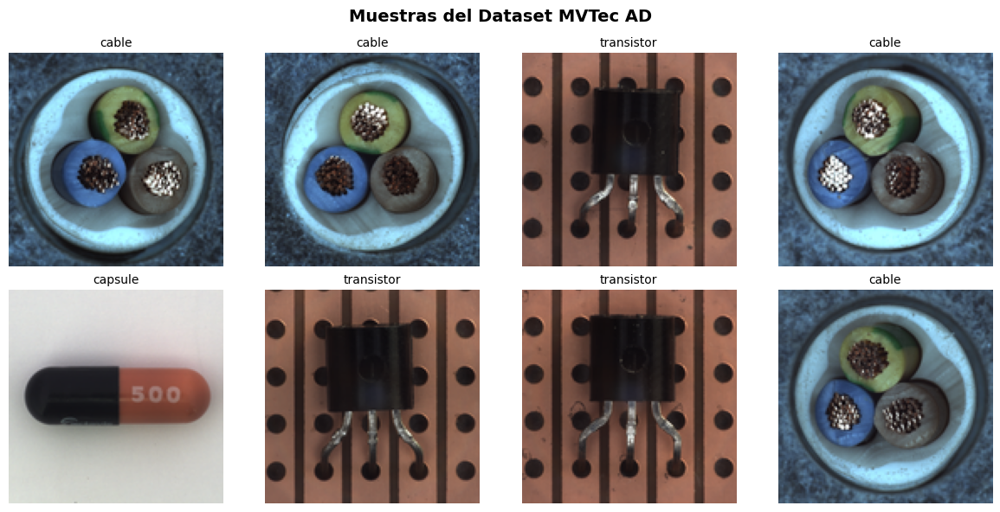

In [ ]:
# Crear el DataModule
modulo_datos = ModuloDatosMVTec(
    ruta_datos=cfg.dataset.ruta,
    clases=cfg.dataset.clases,
    tamano_img=cfg.dataset.tamano_imagen,
    batch_size=cfg.entrenador.batch_size,
    num_workers=cfg.entrenador.num_workers,
    split_entrenamiento=cfg.dataset.split_entrenamiento,
    split_validacion=cfg.dataset.split_validacion
)

# Setup del dataset
modulo_datos.setup('fit')

# Obtener un batch para visualización
dataloader_train = modulo_datos.train_dataloader()
batch_ejemplo = next(iter(dataloader_train))
imagenes_ejemplo, clases_ejemplo = batch_ejemplo

print(f" Dataset cargado bien")
print(f"  - Shape del batch: {imagenes_ejemplo.shape}")
print(f"  - Clases en el batch: {set(clases_ejemplo)}")

# Visualizar algunas imágenes
fig, axes = plt.subplots(2, 4, figsize=(12, 6))
fig.suptitle('Muestras del Dataset MVTec AD', fontsize=14, fontweight='bold')

mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

for idx in range(8):
    ax = axes[idx // 4, idx % 4]

    # Denormalizar imagen
    img = imagenes_ejemplo[idx].cpu()
    img_denorm = torch.clamp(img * std + mean, 0, 1)
    img_denorm = img_denorm.permute(1, 2, 0).numpy()

    ax.imshow(img_denorm)
    ax.set_title(f"{clases_ejemplo[idx]}", fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.show()



## 10. Configuración de Weights & Biases (W&B)

Configuramos W&B para monitorear el entrenamiento. Si es la primera vez, ejecuta `!wandb login` en una celda separada.

In [ ]:
# Configuración de W&B
USAR_WANDB = True  # Cambiar a False para deshabilitar W&B
MODO_OFFLINE = False  # Cambiar a True para modo offline

if USAR_WANDB and MODO_OFFLINE:
    os.environ['WANDB_MODE'] = 'offline'

print(f"W&B habilitado: {USAR_WANDB}")
print(f"Modo offline: {MODO_OFFLINE}")
print(f"Función de pérdida: {cfg.modelo.funcion_perdida.upper()}")

# IMPORTANTE: Si es la primera vez usando W&B, descomenta y ejecuta:
!wandb login

W&B habilitado: True
Modo offline: False
Función de pérdida: L1
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: fabiandiazbarboza (fabiandiazbarboza-tecnol-gico-de-costa-rica) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [ ]:
# Funciones de utilidad para evaluacion

def evaluar_modelo(modelo, dataloader, dispositivo='cuda', num_batches=10):
    """Evalua el modelo con metricas: MAE, PSNR, SSIM"""
    modelo.eval()
    modelo.to(dispositivo)

    mae_scores, psnr_scores, ssim_scores = [], [], []

    with torch.no_grad():
        for i, batch in enumerate(dataloader):
            if i >= num_batches:
                break

            imagenes, _ = batch
            imagenes = imagenes.to(dispositivo)
            reconstrucciones = modelo(imagenes)

            # MAE (L1)
            mae = F.l1_loss(reconstrucciones, imagenes, reduction='mean').item()
            mae_scores.append(mae)

            # Convertir a numpy para PSNR y SSIM
            imgs_np = imagenes.cpu().numpy()
            recons_np = reconstrucciones.cpu().numpy()

            # Calcular PSNR y SSIM por imagen
            for j in range(imgs_np.shape[0]):
                img = imgs_np[j].transpose(1, 2, 0)
                recon = recons_np[j].transpose(1, 2, 0)

                psnr_val = psnr(img, recon, data_range=img.max() - img.min())
                psnr_scores.append(psnr_val)

                ssim_val = ssim(img, recon, channel_axis=2,
                               data_range=img.max() - img.min())
                ssim_scores.append(ssim_val)

    return {
        'mae': np.mean(mae_scores),
        'psnr': np.mean(psnr_scores),
        'ssim': np.mean(ssim_scores)
    }


def visualizar_reconstrucciones(modelo, dataloader, dispositivo='cuda', num_imagenes=16):
    """Visualiza imagenes originales vs reconstruidas"""
    modelo.eval()
    modelo.to(dispositivo)

    batch = next(iter(dataloader))
    imagenes, clases = batch
    imagenes = imagenes[:num_imagenes].to(dispositivo)
    clases = clases[:num_imagenes]

    with torch.no_grad():
        reconstrucciones = modelo(imagenes)

    # Denormalizar
    mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(dispositivo)
    std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(dispositivo)

    imagenes_denorm = torch.clamp(imagenes * std + mean, 0, 1).cpu()
    reconstrucciones_denorm = torch.clamp(reconstrucciones * std + mean, 0, 1).cpu()

    # Visualizar
    num_cols = 4
    num_rows = (num_imagenes * 2 + num_cols - 1) // num_cols

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, num_rows*4))
    axes = axes.flatten()

    for i in range(num_imagenes):
        ax_orig = axes[i*2]
        img_orig = imagenes_denorm[i].permute(1, 2, 0).numpy()
        ax_orig.imshow(img_orig)
        ax_orig.set_title(f'Original\n{clases[i]}', fontsize=10)
        ax_orig.axis('off')

        ax_recon = axes[i*2 + 1]
        img_recon = reconstrucciones_denorm[i].permute(1, 2, 0).numpy()
        ax_recon.imshow(img_recon)
        ax_recon.set_title(f'Reconstruida\n{clases[i]}', fontsize=10)
        ax_recon.axis('off')

    for i in range(num_imagenes*2, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


def visualizar_espacio_latente_tsne(modelo, dataloader, dispositivo='cuda', num_samples=500):
    """Visualiza el espacio latente usando t-SNE"""
    modelo.eval()
    modelo.to(dispositivo)

    vectores_latentes = []
    etiquetas_clases = []

    with torch.no_grad():
        for batch in dataloader:
            imagenes, clases = batch
            imagenes = imagenes.to(dispositivo)

            z = modelo.codificar(imagenes)
            vectores_latentes.append(z.cpu().numpy())
            etiquetas_clases.extend(clases)

            if len(etiquetas_clases) >= num_samples:
                break

    vectores_latentes = np.vstack(vectores_latentes)[:num_samples]
    etiquetas_clases = etiquetas_clases[:num_samples]

    print("Ejecutando t-SNE (esto puede tomar un momento)...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    vectores_2d = tsne.fit_transform(vectores_latentes)

    fig, ax = plt.subplots(figsize=(10, 8))

    clases_unicas = list(set(etiquetas_clases))
    colores = plt.cm.tab10(np.linspace(0, 1, len(clases_unicas)))

    for i, clase in enumerate(clases_unicas):
        indices = [j for j, c in enumerate(etiquetas_clases) if c == clase]
        ax.scatter(vectores_2d[indices, 0], vectores_2d[indices, 1],
                  c=[colores[i]], label=clase, alpha=0.6, s=50)

    ax.set_title('Visualizacion del Espacio Latente (t-SNE)', fontsize=14, fontweight='bold')
    ax.set_xlabel('Componente 1')
    ax.set_ylabel('Componente 2')
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


def calcular_errores_por_clase(modelo, dataloader, dispositivo='cuda'):
    """Calcula el error de reconstruccion (MAE) por clase"""
    modelo.eval()
    modelo.to(dispositivo)

    errores_por_clase = {clase: [] for clase in cfg.dataset.clases}

    with torch.no_grad():
        for batch in dataloader:
            imagenes, clases = batch
            imagenes = imagenes.to(dispositivo)
            reconstrucciones = modelo(imagenes)

            for i, clase in enumerate(clases):
                error = F.l1_loss(reconstrucciones[i], imagenes[i], reduction='mean').item()
                errores_por_clase[clase].append(error)

    return errores_por_clase


print("✓ Funciones de utilidad cargadas")

✓ Funciones de utilidad cargadas


## 10. Funciones de Utilidad para Evaluación

Definimos las funciones de evaluación y visualización que usaremos para cada experimento.

## 11. Entrenamiento con Funcion de Perdida L1

Primera experimentacion: entrenamos el autoencoder con la funcion de perdida L1 (MAE).

Ejecute esta celda y luego continue con las siguientes funciones de perdida (L2, SSIM, SSIM+L1).

In [ ]:
# Diccionario global para almacenar resultados
if 'resultados_experimentos' not in globals():
    resultados_experimentos = {}

# Configurar funcion de perdida L1
import copy
cfg_l1 = copy.deepcopy(cfg)
cfg_l1.modelo.funcion_perdida = 'l1'

# Crear directorio para checkpoints L1
checkpoint_dir_l1 = f"{cfg.entrenador.checkpoint.ruta_guardado}/l1"
os.makedirs(checkpoint_dir_l1, exist_ok=True)

# Callbacks
checkpoint_callback_l1 = ModelCheckpoint(
    dirpath=checkpoint_dir_l1,
    monitor=cfg.entrenador.checkpoint.monitor,
    mode=cfg.entrenador.checkpoint.modo,
    save_top_k=cfg.entrenador.checkpoint.guardar_top_k,
    filename='autoencoder-clasico-l1-{epoch:02d}-{val_loss:.4f}',
    verbose=True
)

early_stop_callback_l1 = EarlyStopping(
    monitor=cfg.entrenador.early_stopping.monitor,
    patience=cfg.entrenador.early_stopping.paciencia,
    mode=cfg.entrenador.early_stopping.modo,
    verbose=True
)

# Logger de W&B
if USAR_WANDB:
    import time
    timestamp = int(time.time())
    wandb_logger_l1 = WandbLogger(
        project=cfg.logger.proyecto,
        name=f"{cfg.logger.nombre}-l1-{timestamp}",
        save_dir=cfg.logger.ruta_guardado,
        offline=MODO_OFFLINE,
        log_model=cfg.logger.log_modelo,
        tags=['l1', 'autoencoder-clasico'],
        reinit=True
    )
    logger_l1 = wandb_logger_l1
    print(f"WandbLogger creado: {cfg.logger.nombre}-l1-{timestamp}")
else:
    logger_l1 = True

# Trainer
entrenador_l1 = pl.Trainer(
    max_epochs=cfg_l1.entrenador.max_epocas,
    accelerator=cfg_l1.entrenador.acelerador,
    devices=cfg_l1.entrenador.dispositivos,
    precision=cfg_l1.entrenador.precision,
    callbacks=[checkpoint_callback_l1, early_stop_callback_l1],
    logger=logger_l1,
    log_every_n_steps=cfg_l1.entrenador.log_cada_n_pasos,
    gradient_clip_val=cfg_l1.entrenador.gradient_clip_val,
    enable_progress_bar=True,
    enable_model_summary=True
)

# Crear y entrenar modelo
modelo_l1 = AutoencoderClasico(cfg_l1)
print(f"\nINICIANDO ENTRENAMIENTO - L1")
print(f"Parametros: {sum(p.numel() for p in modelo_l1.parameters()):,}")
print(f"Epocas: {cfg_l1.entrenador.max_epocas}")

import time
tiempo_inicio_l1 = time.time()
entrenador_l1.fit(modelo_l1, modulo_datos)
tiempo_l1 = time.time() - tiempo_inicio_l1

print(f"\nEntrenamiento L1 completado en {tiempo_l1/60:.1f} minutos")
print(f"Mejor checkpoint: {checkpoint_callback_l1.best_model_path}")

# Cerrar W&B
if USAR_WANDB:
    import wandb
    wandb.finish()
    print("Run de W&B cerrado")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


WandbLogger creado: autoencoder-clasico-colab-l1-1763956274

INICIANDO ENTRENAMIENTO - L1
Parametros: 12,971,971
Epocas: 50


wandb: Currently logged in as: fabiandiazbarboza (fabiandiazbarboza-tecnol-gico-de-costa-rica) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


Dataset cargado:
  - Entrenamiento: 780 imágenes
  - Validación: 196 imágenes


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type       | Params | Mode 
--------------------------------------------------------
0 | criterio_perdida | PerdidaL1  | 0      | train
1 | encoder          | Sequential | 3.9 M  | train
2 | fc_encoder       | Linear     | 1.0 M  | train
3 | fc_decoder       | Linear     | 1.1 M  | train
4 | decoder          | Sequential | 7.0 M  | train
--------------------------------------------------------
13.0 M    Trainable params
0         Non-trainable params
13.0 M    Total params
51.888    Total estimated model params size (MB)
35        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.685
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 25: 'val_loss' reached 0.68485 (best 0.68485), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=00-val_loss=0.6849.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.140 >= min_delta = 0.0. New best score: 0.545
INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 50: 'val_loss' reached 0.54471 (best 0.54471), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=01-val_loss=0.5447.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.525
INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 75: 'val_loss' reached 0.52468 (best 0.52468), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=02-val_loss=0.5247.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.519
INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 100: 'val_loss' reached 0.51912 (best 0.51912), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=03-val_loss=0.5191.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 0.502
INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 125: 'val_loss' reached 0.50164 (best 0.50164), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=04-val_loss=0.5016.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 0.475
INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 150: 'val_loss' reached 0.47463 (best 0.47463), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=05-val_loss=0.4746.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 175: 'val_loss' reached 0.47569 (best 0.47463), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=06-val_loss=0.4757.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.471
INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 200: 'val_loss' reached 0.47086 (best 0.47086), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=07-val_loss=0.4709.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 225: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.466
INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 250: 'val_loss' reached 0.46639 (best 0.46639), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=09-val_loss=0.4664.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 275: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 300: 'val_loss' reached 0.46711 (best 0.46639), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=11-val_loss=0.4671.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.462
INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 325: 'val_loss' reached 0.46150 (best 0.46150), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=12-val_loss=0.4615.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.460
INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 350: 'val_loss' reached 0.45956 (best 0.45956), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=13-val_loss=0.4596.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.458
INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 375: 'val_loss' reached 0.45765 (best 0.45765), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=14-val_loss=0.4577.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 400: 'val_loss' reached 0.45899 (best 0.45765), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=15-val_loss=0.4590.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 425: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.442
INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 450: 'val_loss' reached 0.44219 (best 0.44219), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=17-val_loss=0.4422.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 475: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 500: 'val_loss' reached 0.44939 (best 0.44219), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=19-val_loss=0.4494.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.439
INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 525: 'val_loss' reached 0.43941 (best 0.43941), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=20-val_loss=0.4394.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 550: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 575: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.437
INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 600: 'val_loss' reached 0.43701 (best 0.43701), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=23-val_loss=0.4370.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 625: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.434
INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 650: 'val_loss' reached 0.43424 (best 0.43424), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=25-val_loss=0.4342.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.431
INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 675: 'val_loss' reached 0.43144 (best 0.43144), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=26-val_loss=0.4314.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 700: 'val_loss' reached 0.43440 (best 0.43144), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=27-val_loss=0.4344.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 725: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 750: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.423
INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 775: 'val_loss' reached 0.42326 (best 0.42326), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=30-val_loss=0.4233.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 800: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 825: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 850: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 875: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 900: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 925: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 950: 'val_loss' reached 0.43318 (best 0.42326), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=37-val_loss=0.4332.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 975: 'val_loss' reached 0.43139 (best 0.42326), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=38-val_loss=0.4314.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 1000: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 10 records. Best score: 0.423. Signaling Trainer to stop.
INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 1025: 'val_loss' reached 0.42667 (best 0.42326), saving model to '/content/checkpoints/l1/autoencoder-clasico-l1-epoch=40-val_loss=0.4267.ckpt' as top 3



Entrenamiento L1 completado en 7.2 minutos
Mejor checkpoint: /content/checkpoints/l1/autoencoder-clasico-l1-epoch=30-val_loss=0.4233.ckpt


epoch,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇████
l1/epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
train_loss_epoch,█▄▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▂▂▂▂▁▁▁▁▁
train_loss_step,█▆▆▆▄▄▄▄▄▃▅▃▆▂▃▂▃▂▂▃▂▂▂▃▃▃▁▂▁▂▅▄▃▃▂▂▁▃▂▂
trainer/global_step,▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇███
val_loss,█▄▄▄▃▂▂▂▃▂▄▂▂▂▂▂▃▂▂▂▁▂▄▁▄▁▁▁▂▂▁▇▂▂▂▂▂▁▁▁
epoch,40
l1/epoch,40
train_loss_epoch,0.4209
train_loss_step,0.43435
trainer/global_step,1024


Run de W&B cerrado


In [ ]:
# Diagnostico de W&B - L1
if USAR_WANDB:
    print("DIAGNOSTICO W&B - L1")

    # Obtener la URL del run
    api = wandb.Api()
    runs = api.runs(path=f"{cfg.logger.proyecto}")

    # Buscar el run de L1 más reciente
    l1_runs = [r for r in runs if '-l1-' in r.name]
    if l1_runs:
        ultimo_run = l1_runs[0]
        print(f"\n Run encontrado: {ultimo_run.name}")
        print(f"  URL: {ultimo_run.url}")
        print(f"  Estado: {ultimo_run.state}")
        print(f"  Epocas logueadas: {ultimo_run.summary.get('epoch', 'N/A')}")
        print(f"  Global steps: {ultimo_run.summary.get('_step', 'N/A')}")

        # Buscar claves de imágenes
        print(f"\n  Claves disponibles:")
        keys_imagenes = [k for k in ultimo_run.summary.keys() if 'reconstrucciones' in k.lower()]
        if keys_imagenes:
            for key in keys_imagenes:
                print(f"    - {key}")
        else:
            print("      No se encontraron claves de imágenes")

        print(f"\n  Para ver las imágenes:")
        print(f"  1. Vaya a: {ultimo_run.url}")
        print(f"  2. Busque la sección 'Media' o 'Images' en el panel izquierdo")
        print(f"  3. Busque las claves: l1/val_reconstrucciones")
        print(f"  4. Use el slider de 'Step' para ver diferentes épocas")
    else:
        print("\n  No se encontraron runs de L1")


    # Verificar checkpoints
    print(f"\n✓ Checkpoint guardado en: {checkpoint_callback_l1.best_model_path}")
    if os.path.exists(checkpoint_dir_l1):
        checkpoints = [f for f in os.listdir(checkpoint_dir_l1) if f.endswith('.ckpt')]
        print(f"  Checkpoints disponibles: {len(checkpoints)}")
        for ckpt in checkpoints[:3]:
            print(f"    - {ckpt}")
else:
    print("W&B no está activado (USAR_WANDB = False)")

DIAGNOSTICO W&B - L1

 Run encontrado: autoencoder-clasico-colab-l1-1763956274
  URL: https://wandb.ai/fabiandiazbarboza-tecnol-gico-de-costa-rica/autoencoder-clasico-mvtec/runs/pyne6v2t
  Estado: finished
  Epocas logueadas: 40
  Global steps: 1026

  Claves disponibles:
    - l1/val_reconstrucciones

  Para ver las imágenes:
  1. Vaya a: https://wandb.ai/fabiandiazbarboza-tecnol-gico-de-costa-rica/autoencoder-clasico-mvtec/runs/pyne6v2t
  2. Busque la sección 'Media' o 'Images' en el panel izquierdo
  3. Busque las claves: l1/val_reconstrucciones
  4. Use el slider de 'Step' para ver diferentes épocas

✓ Checkpoint guardado en: /content/checkpoints/l1/autoencoder-clasico-l1-epoch=30-val_loss=0.4233.ckpt
  Checkpoints disponibles: 3
    - autoencoder-clasico-l1-epoch=40-val_loss=0.4267.ckpt
    - autoencoder-clasico-l1-epoch=38-val_loss=0.4314.ckpt
    - autoencoder-clasico-l1-epoch=30-val_loss=0.4233.ckpt


### Evaluacion y Visualizacion - L1

Evaluando modelo L1...
  MAE: 0.424291
  PSNR: 17.6960 dB
  SSIM: 0.6145

Generando visualizaciones L1...
  - Reconstrucciones


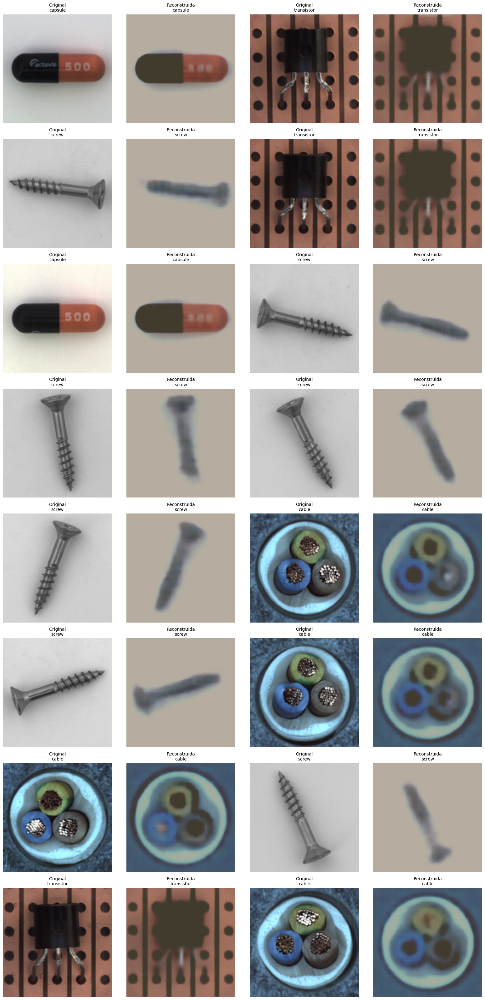

  - t-SNE del espacio latente
Ejecutando t-SNE (esto puede tomar un momento)...


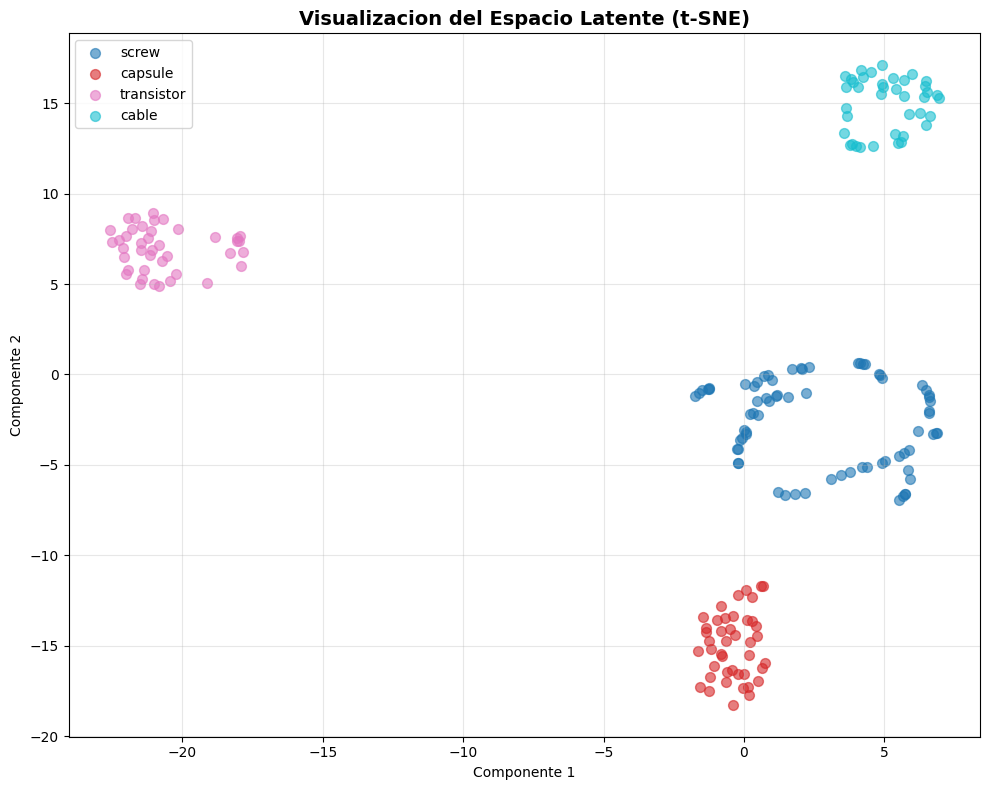

  - Histogramas de error por clase


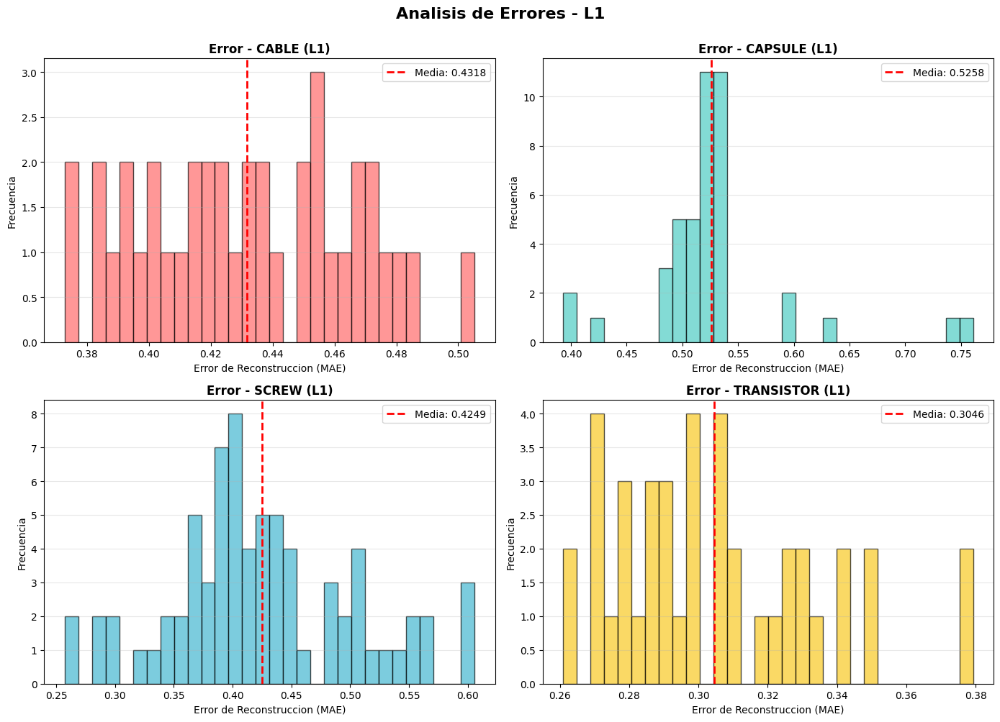


Experimento L1 completado


In [ ]:
# Cargar mejor modelo L1
mejor_modelo_l1 = AutoencoderClasico.load_from_checkpoint(
    checkpoint_callback_l1.best_model_path,
    config=cfg_l1
)
mejor_modelo_l1.eval()
device = 'cuda' if torch.cuda.is_available() else 'cpu'
mejor_modelo_l1.to(device)

# Evaluacion cuantitativa
print("Evaluando modelo L1...")
metricas_l1 = evaluar_modelo(mejor_modelo_l1, modulo_datos.val_dataloader(), dispositivo=device, num_batches=20)
print(f"  MAE: {metricas_l1['mae']:.6f}")
print(f"  PSNR: {metricas_l1['psnr']:.4f} dB")
print(f"  SSIM: {metricas_l1['ssim']:.4f}")

# Guardar resultados
resultados_experimentos['l1'] = {
    'metricas': metricas_l1,
    'checkpoint': checkpoint_callback_l1.best_model_path,
    'tiempo_entrenamiento': tiempo_l1,
    'val_loss_final': checkpoint_callback_l1.best_model_score.item() if checkpoint_callback_l1.best_model_score else None
}

# Visualizaciones
print("\nGenerando visualizaciones L1...")
print("  - Reconstrucciones")
visualizar_reconstrucciones(mejor_modelo_l1, modulo_datos.val_dataloader(), dispositivo=device, num_imagenes=16)

print("  - t-SNE del espacio latente")
visualizar_espacio_latente_tsne(mejor_modelo_l1, modulo_datos.val_dataloader(), dispositivo=device, num_samples=500)

print("  - Histogramas de error por clase")
errores_por_clase_l1 = calcular_errores_por_clase(mejor_modelo_l1, modulo_datos.val_dataloader(), dispositivo=device)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()
colores = ['#ff6b6b', '#4ecdc4', '#45b7d1', '#f9ca24']

for idx, (clase, errores) in enumerate(errores_por_clase_l1.items()):
    ax = axes[idx]
    ax.hist(errores, bins=30, color=colores[idx], alpha=0.7, edgecolor='black')
    ax.set_title(f'Error - {clase.upper()} (L1)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Error de Reconstruccion (MAE)')
    ax.set_ylabel('Frecuencia')
    ax.grid(axis='y', alpha=0.3)
    media = np.mean(errores)
    ax.axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.4f}')
    ax.legend()

plt.suptitle('Analisis de Errores - L1', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

print("\nExperimento L1 completado")

## 12. Entrenamiento con Funcion de Perdida L2

Segunda experimentacion: entrenamos el autoencoder con la funcion de perdida L2 (MSE).

In [ ]:
# Configurar funcion de perdida L2
cfg_l2 = copy.deepcopy(cfg)
cfg_l2.modelo.funcion_perdida = 'l2'

# Crear directorio para checkpoints L2
checkpoint_dir_l2 = f"{cfg.entrenador.checkpoint.ruta_guardado}/l2"
os.makedirs(checkpoint_dir_l2, exist_ok=True)

# Callbacks
checkpoint_callback_l2 = ModelCheckpoint(
    dirpath=checkpoint_dir_l2,
    monitor=cfg.entrenador.checkpoint.monitor,
    mode=cfg.entrenador.checkpoint.modo,
    save_top_k=cfg.entrenador.checkpoint.guardar_top_k,
    filename='autoencoder-clasico-l2-{epoch:02d}-{val_loss:.4f}',
    verbose=True
)

early_stop_callback_l2 = EarlyStopping(
    monitor=cfg.entrenador.early_stopping.monitor,
    patience=cfg.entrenador.early_stopping.paciencia,
    mode=cfg.entrenador.early_stopping.modo,
    verbose=True
)

# Logger de W&B
if USAR_WANDB:
    timestamp = int(time.time())
    wandb_logger_l2 = WandbLogger(
        project=cfg.logger.proyecto,
        name=f"{cfg.logger.nombre}-l2-{timestamp}",
        save_dir=cfg.logger.ruta_guardado,
        offline=MODO_OFFLINE,
        log_model=cfg.logger.log_modelo,
        tags=['l2', 'autoencoder-clasico'],
        reinit=True
    )
    logger_l2 = wandb_logger_l2
    print(f"WandbLogger creado: {cfg.logger.nombre}-l2-{timestamp}")
else:
    logger_l2 = True

# Trainer
entrenador_l2 = pl.Trainer(
    max_epochs=cfg_l2.entrenador.max_epocas,
    accelerator=cfg_l2.entrenador.acelerador,
    devices=cfg_l2.entrenador.dispositivos,
    precision=cfg_l2.entrenador.precision,
    callbacks=[checkpoint_callback_l2, early_stop_callback_l2],
    logger=logger_l2,
    log_every_n_steps=cfg_l2.entrenador.log_cada_n_pasos,
    gradient_clip_val=cfg_l2.entrenador.gradient_clip_val,
    enable_progress_bar=True,
    enable_model_summary=True
)

# Crear y entrenar modelo
modelo_l2 = AutoencoderClasico(cfg_l2)
print(f"\nINICIANDO ENTRENAMIENTO - L2")
print(f"Parametros: {sum(p.numel() for p in modelo_l2.parameters()):,}")
print(f"Epocas: {cfg_l2.entrenador.max_epocas}")

tiempo_inicio_l2 = time.time()
entrenador_l2.fit(modelo_l2, modulo_datos)
tiempo_l2 = time.time() - tiempo_inicio_l2

print(f"\nEntrenamiento L2 completado en {tiempo_l2/60:.1f} minutos")
print(f"Mejor checkpoint: {checkpoint_callback_l2.best_model_path}")

# Cerrar W&B
if USAR_WANDB:
    wandb.finish()
    print("Run de W&B cerrado")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


WandbLogger creado: autoencoder-clasico-colab-l2-1763956909

INICIANDO ENTRENAMIENTO - L2
Parametros: 12,971,971
Epocas: 50


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type       | Params | Mode 
--------------------------------------------------------
0 | criterio_perdida | PerdidaL2  | 0      | train
1 | encoder          | Sequential | 3.9 M  | train
2 | fc_encoder       | Linear     | 1.0 M  | train
3 | fc_decoder       | Linear     | 1.1 M  | train
4 | decoder          | Sequential | 7.0 M  | train
--------------------------------------------------------
13.0 M    Trainable params
0         Non-trainable params
13.0 M    Total params
51.888    Total estimated model params size (MB)
35        Modules in train mode
0         Modules in eval mode


Dataset cargado:
  - Entrenamiento: 780 imágenes
  - Validación: 196 imágenes


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.790
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 25: 'val_loss' reached 0.79027 (best 0.79027), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=00-val_loss=0.7903.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.350 >= min_delta = 0.0. New best score: 0.441
INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 50: 'val_loss' reached 0.44072 (best 0.44072), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=01-val_loss=0.4407.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.039 >= min_delta = 0.0. New best score: 0.401
INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 75: 'val_loss' reached 0.40149 (best 0.40149), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=02-val_loss=0.4015.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.381
INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 100: 'val_loss' reached 0.38109 (best 0.38109), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=03-val_loss=0.3811.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.357
INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 125: 'val_loss' reached 0.35654 (best 0.35654), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=04-val_loss=0.3565.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 150: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.346
INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 175: 'val_loss' reached 0.34608 (best 0.34608), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=06-val_loss=0.3461.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.334
INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 200: 'val_loss' reached 0.33367 (best 0.33367), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=07-val_loss=0.3337.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.331
INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 225: 'val_loss' reached 0.33140 (best 0.33140), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=08-val_loss=0.3314.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.331
INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 250: 'val_loss' reached 0.33111 (best 0.33111), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=09-val_loss=0.3311.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.307
INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 275: 'val_loss' reached 0.30658 (best 0.30658), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=10-val_loss=0.3066.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 300: 'val_loss' reached 0.33128 (best 0.30658), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=11-val_loss=0.3313.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 325: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 350: 'val_loss' reached 0.32083 (best 0.30658), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=13-val_loss=0.3208.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 375: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 400: 'val_loss' reached 0.31742 (best 0.30658), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=15-val_loss=0.3174.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 425: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.304
INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 450: 'val_loss' reached 0.30387 (best 0.30387), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=17-val_loss=0.3039.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.297
INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 475: 'val_loss' reached 0.29674 (best 0.29674), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=18-val_loss=0.2967.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 500: 'val_loss' reached 0.29975 (best 0.29674), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=19-val_loss=0.2998.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 525: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.291
INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 550: 'val_loss' reached 0.29128 (best 0.29128), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=21-val_loss=0.2913.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 575: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 600: 'val_loss' reached 0.29478 (best 0.29128), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=23-val_loss=0.2948.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.290
INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 625: 'val_loss' reached 0.28953 (best 0.28953), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=24-val_loss=0.2895.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.287
INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 650: 'val_loss' reached 0.28726 (best 0.28726), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=25-val_loss=0.2873.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 675: 'val_loss' reached 0.29010 (best 0.28726), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=26-val_loss=0.2901.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 700: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 725: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.284
INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 750: 'val_loss' reached 0.28424 (best 0.28424), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=29-val_loss=0.2842.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.283
INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 775: 'val_loss' reached 0.28309 (best 0.28309), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=30-val_loss=0.2831.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 800: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.281
INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 825: 'val_loss' reached 0.28141 (best 0.28141), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=32-val_loss=0.2814.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 850: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 875: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 900: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 925: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 950: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 975: 'val_loss' reached 0.28278 (best 0.28141), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=38-val_loss=0.2828.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.275
INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 1000: 'val_loss' reached 0.27475 (best 0.27475), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=39-val_loss=0.2747.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.275
INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 1025: 'val_loss' reached 0.27473 (best 0.27473), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=40-val_loss=0.2747.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.273
INFO:pytorch_lightning.utilities.rank_zero:Epoch 41, global step 1050: 'val_loss' reached 0.27342 (best 0.27342), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=41-val_loss=0.2734.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.271
INFO:pytorch_lightning.utilities.rank_zero:Epoch 42, global step 1075: 'val_loss' reached 0.27149 (best 0.27149), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=42-val_loss=0.2715.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.271
INFO:pytorch_lightning.utilities.rank_zero:Epoch 43, global step 1100: 'val_loss' reached 0.27121 (best 0.27121), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=43-val_loss=0.2712.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.271
INFO:pytorch_lightning.utilities.rank_zero:Epoch 44, global step 1125: 'val_loss' reached 0.27081 (best 0.27081), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=44-val_loss=0.2708.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.269
INFO:pytorch_lightning.utilities.rank_zero:Epoch 45, global step 1150: 'val_loss' reached 0.26905 (best 0.26905), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=45-val_loss=0.2691.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.269
INFO:pytorch_lightning.utilities.rank_zero:Epoch 46, global step 1175: 'val_loss' reached 0.26851 (best 0.26851), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=46-val_loss=0.2685.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.266
INFO:pytorch_lightning.utilities.rank_zero:Epoch 47, global step 1200: 'val_loss' reached 0.26636 (best 0.26636), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=47-val_loss=0.2664.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 48, global step 1225: 'val_loss' reached 0.26719 (best 0.26636), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=48-val_loss=0.2672.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.265
INFO:pytorch_lightning.utilities.rank_zero:Epoch 49, global step 1250: 'val_loss' reached 0.26493 (best 0.26493), saving model to '/content/checkpoints/l2/autoencoder-clasico-l2-epoch=49-val_loss=0.2649.ckpt' as top 3
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.



Entrenamiento L2 completado en 4.4 minutos
Mejor checkpoint: /content/checkpoints/l2/autoencoder-clasico-l2-epoch=49-val_loss=0.2649.ckpt


epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇██
l2/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss_epoch,█▄▃▂▂▂▂▂▂▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁
train_loss_step,█▃▃▂▂▂▂▁▁▂▂▁▁▂▂▂▂▂▂▁▂▂▁▁▂▁▁▂▂▂▁▁▁▂▂▁▁▁▁▂
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇█████
val_loss,█▃▃▃▂▂▂▂▂▂▃▂▃▂▂▁▁▂▁▃▁▁▁▁▁▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch,49
l2/epoch,49
train_loss_epoch,0.26301
train_loss_step,0.28335
trainer/global_step,1249


Run de W&B cerrado


### Evaluacion y Visualizacion - L2

Evaluando modelo L2...
  MAE: 0.408283
  PSNR: 18.1073 dB
  SSIM: 0.6495

Generando visualizaciones L2...
  - Reconstrucciones


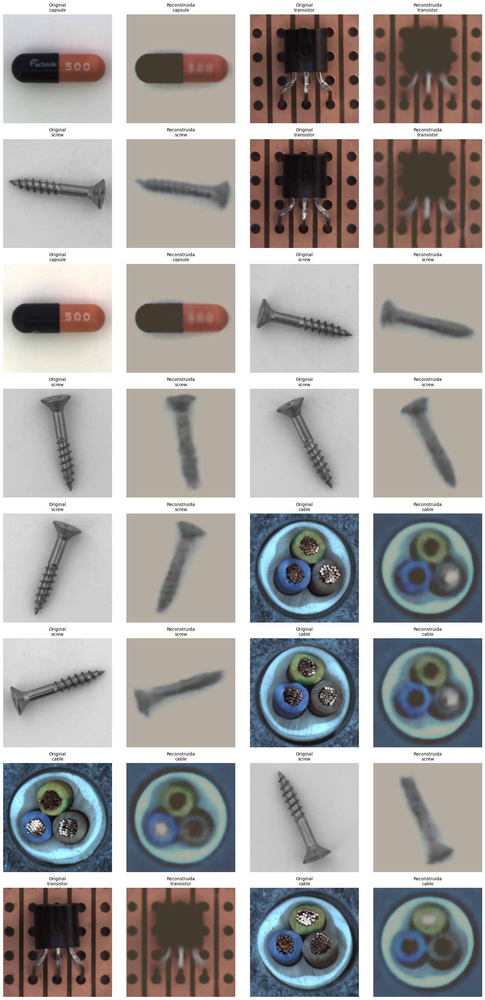

  - t-SNE del espacio latente
Ejecutando t-SNE (esto puede tomar un momento)...


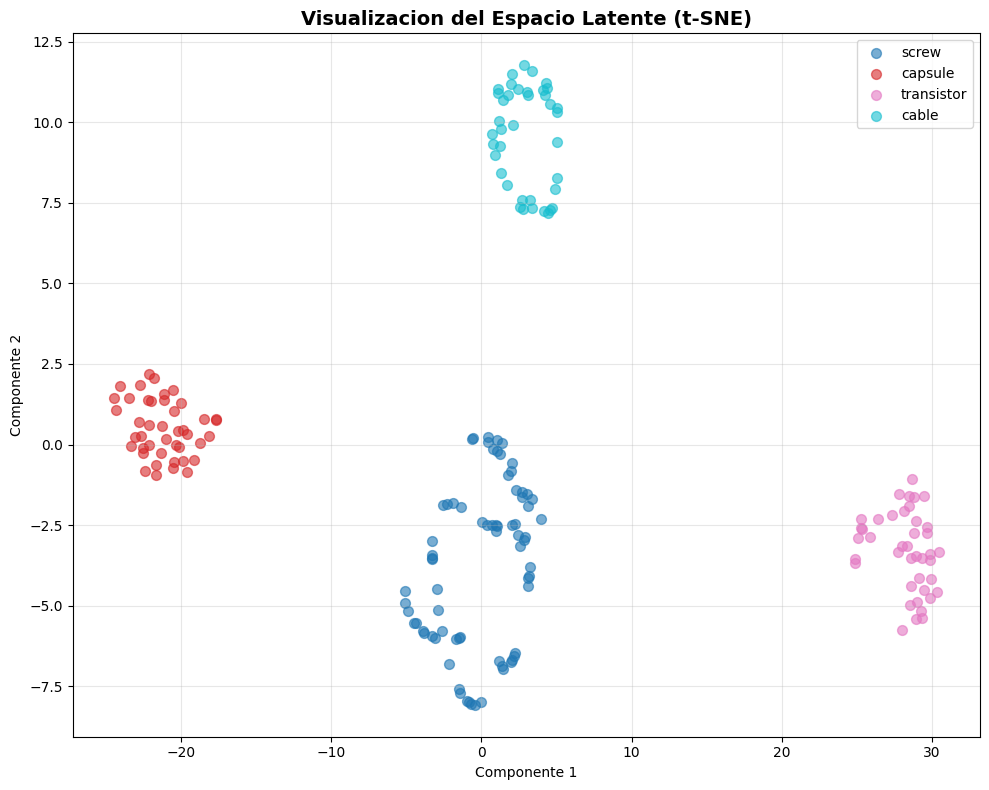

  - Histogramas de error por clase


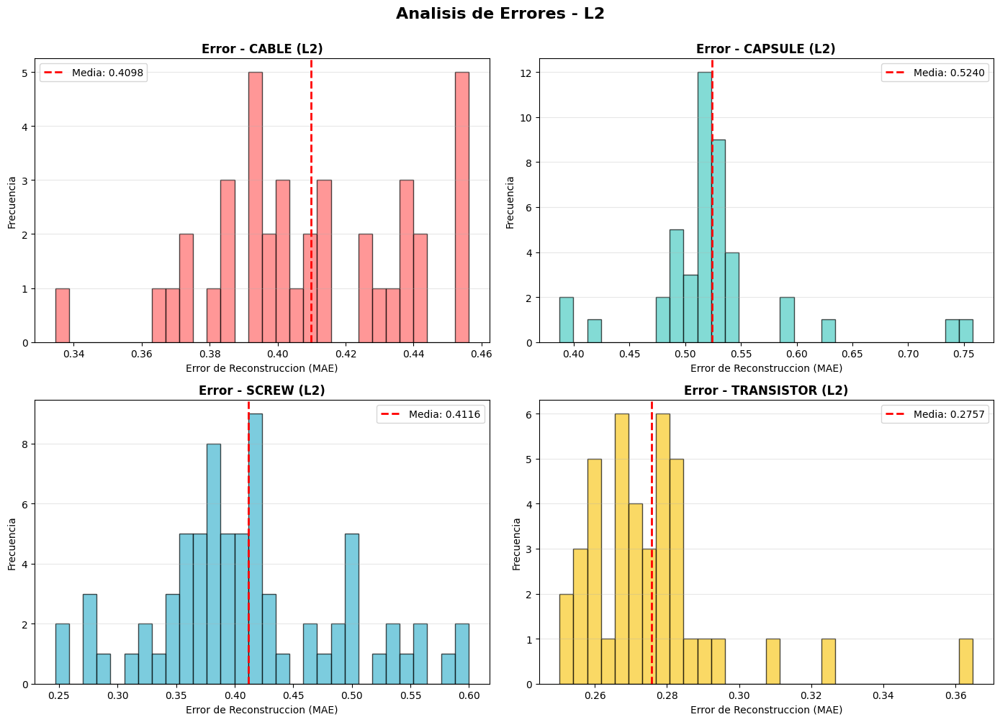


Experimento L2 completado


In [ ]:
# Cargar mejor modelo L2
mejor_modelo_l2 = AutoencoderClasico.load_from_checkpoint(
    checkpoint_callback_l2.best_model_path,
    config=cfg_l2
)
mejor_modelo_l2.eval()
mejor_modelo_l2.to(device)

# Evaluacion cuantitativa
print("Evaluando modelo L2...")
metricas_l2 = evaluar_modelo(mejor_modelo_l2, modulo_datos.val_dataloader(), dispositivo=device, num_batches=20)
print(f"  MAE: {metricas_l2['mae']:.6f}")
print(f"  PSNR: {metricas_l2['psnr']:.4f} dB")
print(f"  SSIM: {metricas_l2['ssim']:.4f}")

# Guardar resultados
resultados_experimentos['l2'] = {
    'metricas': metricas_l2,
    'checkpoint': checkpoint_callback_l2.best_model_path,
    'tiempo_entrenamiento': tiempo_l2,
    'val_loss_final': checkpoint_callback_l2.best_model_score.item() if checkpoint_callback_l2.best_model_score else None
}

# Visualizaciones
print("\nGenerando visualizaciones L2...")
print("  - Reconstrucciones")
visualizar_reconstrucciones(mejor_modelo_l2, modulo_datos.val_dataloader(), dispositivo=device, num_imagenes=16)

print("  - t-SNE del espacio latente")
visualizar_espacio_latente_tsne(mejor_modelo_l2, modulo_datos.val_dataloader(), dispositivo=device, num_samples=500)

print("  - Histogramas de error por clase")
errores_por_clase_l2 = calcular_errores_por_clase(mejor_modelo_l2, modulo_datos.val_dataloader(), dispositivo=device)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()
colores = ['#ff6b6b', '#4ecdc4', '#45b7d1', '#f9ca24']

for idx, (clase, errores) in enumerate(errores_por_clase_l2.items()):
    ax = axes[idx]
    ax.hist(errores, bins=30, color=colores[idx], alpha=0.7, edgecolor='black')
    ax.set_title(f'Error - {clase.upper()} (L2)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Error de Reconstruccion (MAE)')
    ax.set_ylabel('Frecuencia')
    ax.grid(axis='y', alpha=0.3)
    media = np.mean(errores)
    ax.axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.4f}')
    ax.legend()

plt.suptitle('Analisis de Errores - L2', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

print("\nExperimento L2 completado")

## 13. Entrenamiento con Funcion de Perdida SSIM

Tercera experimentacion: entrenamos el autoencoder con la funcion de perdida SSIM (Structural Similarity).

In [ ]:
# Configurar funcion de perdida SSIM
cfg_ssim = copy.deepcopy(cfg)
cfg_ssim.modelo.funcion_perdida = 'ssim'

# Crear directorio para checkpoints SSIM
checkpoint_dir_ssim = f"{cfg.entrenador.checkpoint.ruta_guardado}/ssim"
os.makedirs(checkpoint_dir_ssim, exist_ok=True)

# Callbacks
checkpoint_callback_ssim = ModelCheckpoint(
    dirpath=checkpoint_dir_ssim,
    monitor=cfg.entrenador.checkpoint.monitor,
    mode=cfg.entrenador.checkpoint.modo,
    save_top_k=cfg.entrenador.checkpoint.guardar_top_k,
    filename='autoencoder-clasico-ssim-{epoch:02d}-{val_loss:.4f}',
    verbose=True
)

early_stop_callback_ssim = EarlyStopping(
    monitor=cfg.entrenador.early_stopping.monitor,
    patience=cfg.entrenador.early_stopping.paciencia,
    mode=cfg.entrenador.early_stopping.modo,
    verbose=True
)

# Logger de W&B
if USAR_WANDB:
    timestamp = int(time.time())
    wandb_logger_ssim = WandbLogger(
        project=cfg.logger.proyecto,
        name=f"{cfg.logger.nombre}-ssim-{timestamp}",
        save_dir=cfg.logger.ruta_guardado,
        offline=MODO_OFFLINE,
        log_model=cfg.logger.log_modelo,
        tags=['ssim', 'autoencoder-clasico'],
        reinit=True
    )
    logger_ssim = wandb_logger_ssim
    print(f"WandbLogger creado: {cfg.logger.nombre}-ssim-{timestamp}")
else:
    logger_ssim = True

# Trainer
entrenador_ssim = pl.Trainer(
    max_epochs=cfg_ssim.entrenador.max_epocas,
    accelerator=cfg_ssim.entrenador.acelerador,
    devices=cfg_ssim.entrenador.dispositivos,
    precision=cfg_ssim.entrenador.precision,
    callbacks=[checkpoint_callback_ssim, early_stop_callback_ssim],
    logger=logger_ssim,
    log_every_n_steps=cfg_ssim.entrenador.log_cada_n_pasos,
    gradient_clip_val=cfg_ssim.entrenador.gradient_clip_val,
    enable_progress_bar=True,
    enable_model_summary=True
)

# Crear y entrenar modelo
modelo_ssim = AutoencoderClasico(cfg_ssim)
print(f"\nINICIANDO ENTRENAMIENTO - SSIM")
print(f"Parametros: {sum(p.numel() for p in modelo_ssim.parameters()):,}")
print(f"Epocas: {cfg_ssim.entrenador.max_epocas}")

tiempo_inicio_ssim = time.time()
entrenador_ssim.fit(modelo_ssim, modulo_datos)
tiempo_ssim = time.time() - tiempo_inicio_ssim

print(f"\nEntrenamiento SSIM completado en {tiempo_ssim/60:.1f} minutos")
print(f"Mejor checkpoint: {checkpoint_callback_ssim.best_model_path}")

# Cerrar W&B
if USAR_WANDB:
    wandb.finish()
    print("Run de W&B cerrado")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


WandbLogger creado: autoencoder-clasico-colab-ssim-1763957279

INICIANDO ENTRENAMIENTO - SSIM
Parametros: 12,971,971
Epocas: 50


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type        | Params | Mode 
---------------------------------------------------------
0 | criterio_perdida | PerdidaSSIM | 0      | train
1 | encoder          | Sequential  | 3.9 M  | train
2 | fc_encoder       | Linear      | 1.0 M  | train
3 | fc_decoder       | Linear      | 1.1 M  | train
4 | decoder          | Sequential  | 7.0 M  | train
---------------------------------------------------------
13.0 M    Trainable params
0         Non-trainable params
13.0 M    Total params
51.888    Total estimated model params size (MB)
35        Modules in train mode
0         Modules in eval mode


Dataset cargado:
  - Entrenamiento: 780 imágenes
  - Validación: 196 imágenes


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.434
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 25: 'val_loss' reached 0.43405 (best 0.43405), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=00-val_loss=0.4341.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.033 >= min_delta = 0.0. New best score: 0.401
INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 50: 'val_loss' reached 0.40083 (best 0.40083), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=01-val_loss=0.4008.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.386
INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 75: 'val_loss' reached 0.38640 (best 0.38640), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=02-val_loss=0.3864.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.042 >= min_delta = 0.0. New best score: 0.344
INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 100: 'val_loss' reached 0.34431 (best 0.34431), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=03-val_loss=0.3443.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 0.323
INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 125: 'val_loss' reached 0.32346 (best 0.32346), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=04-val_loss=0.3235.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 150: 'val_loss' reached 0.33191 (best 0.32346), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=05-val_loss=0.3319.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.299
INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 175: 'val_loss' reached 0.29858 (best 0.29858), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=06-val_loss=0.2986.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 200: 'val_loss' reached 0.31259 (best 0.29858), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=07-val_loss=0.3126.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.287
INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 225: 'val_loss' reached 0.28743 (best 0.28743), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=08-val_loss=0.2874.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 250: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 275: 'val_loss' reached 0.29073 (best 0.28743), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=10-val_loss=0.2907.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 300: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.285
INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 325: 'val_loss' reached 0.28512 (best 0.28512), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=12-val_loss=0.2851.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 350: 'val_loss' reached 0.28633 (best 0.28512), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=13-val_loss=0.2863.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.282
INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 375: 'val_loss' reached 0.28206 (best 0.28206), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=14-val_loss=0.2821.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.274
INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 400: 'val_loss' reached 0.27374 (best 0.27374), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=15-val_loss=0.2737.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.269
INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 425: 'val_loss' reached 0.26927 (best 0.26927), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=16-val_loss=0.2693.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 450: 'val_loss' reached 0.27155 (best 0.26927), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=17-val_loss=0.2716.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 475: 'val_loss' reached 0.27275 (best 0.26927), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=18-val_loss=0.2728.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 500: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 525: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.268
INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 550: 'val_loss' reached 0.26845 (best 0.26845), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=21-val_loss=0.2684.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 575: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 600: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 625: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 650: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 675: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 700: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.263
INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 725: 'val_loss' reached 0.26340 (best 0.26340), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=28-val_loss=0.2634.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.262
INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 750: 'val_loss' reached 0.26190 (best 0.26190), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=29-val_loss=0.2619.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 775: 'val_loss' reached 0.26568 (best 0.26190), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=30-val_loss=0.2657.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.257
INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 800: 'val_loss' reached 0.25652 (best 0.25652), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=31-val_loss=0.2565.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.255
INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 825: 'val_loss' reached 0.25464 (best 0.25464), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=32-val_loss=0.2546.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 850: 'val_loss' reached 0.26136 (best 0.25464), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=33-val_loss=0.2614.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.254
INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 875: 'val_loss' reached 0.25407 (best 0.25407), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=34-val_loss=0.2541.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.249
INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 900: 'val_loss' reached 0.24901 (best 0.24901), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=35-val_loss=0.2490.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 925: 'val_loss' reached 0.25174 (best 0.24901), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=36-val_loss=0.2517.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 950: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 975: 'val_loss' reached 0.25042 (best 0.24901), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=38-val_loss=0.2504.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.248
INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 1000: 'val_loss' reached 0.24771 (best 0.24771), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=39-val_loss=0.2477.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 1025: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 41, global step 1050: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 42, global step 1075: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.248
INFO:pytorch_lightning.utilities.rank_zero:Epoch 43, global step 1100: 'val_loss' reached 0.24756 (best 0.24756), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=43-val_loss=0.2476.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 44, global step 1125: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 45, global step 1150: 'val_loss' was not in top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.245
INFO:pytorch_lightning.utilities.rank_zero:Epoch 46, global step 1175: 'val_loss' reached 0.24468 (best 0.24468), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=46-val_loss=0.2447.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.243
INFO:pytorch_lightning.utilities.rank_zero:Epoch 47, global step 1200: 'val_loss' reached 0.24331 (best 0.24331), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=47-val_loss=0.2433.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.243
INFO:pytorch_lightning.utilities.rank_zero:Epoch 48, global step 1225: 'val_loss' reached 0.24294 (best 0.24294), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=48-val_loss=0.2429.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.239
INFO:pytorch_lightning.utilities.rank_zero:Epoch 49, global step 1250: 'val_loss' reached 0.23884 (best 0.23884), saving model to '/content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=49-val_loss=0.2388.ckpt' as top 3
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.



Entrenamiento SSIM completado en 6.4 minutos
Mejor checkpoint: /content/checkpoints/ssim/autoencoder-clasico-ssim-epoch=49-val_loss=0.2388.ckpt


epoch,▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇█████
ssim/epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
train_loss_epoch,█▆▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss_step,█▇▇▆▆▃▄▃▂▃▃▂▃▂▂▂▃▃▃▃▂▃▂▃▃▁▂▁▂▂▁▂▂▂▂▂▂▁▂▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇██
val_loss,█▇▆▄▄▄▃▅▃▅▃▃▂▂▂▃▃▂▃▄▅▃▆▂▂▂▂▂▂▁▁▁▁▂▁▁▂▁▁▁
epoch,49
ssim/epoch,49
train_loss_epoch,0.24431
train_loss_step,0.22626
trainer/global_step,1249


Run de W&B cerrado


### Evaluacion y Visualizacion - SSIM

Evaluando modelo SSIM...
  MAE: 0.603828
  PSNR: 14.5575 dB
  SSIM: 0.6148

Generando visualizaciones SSIM...
  - Reconstrucciones


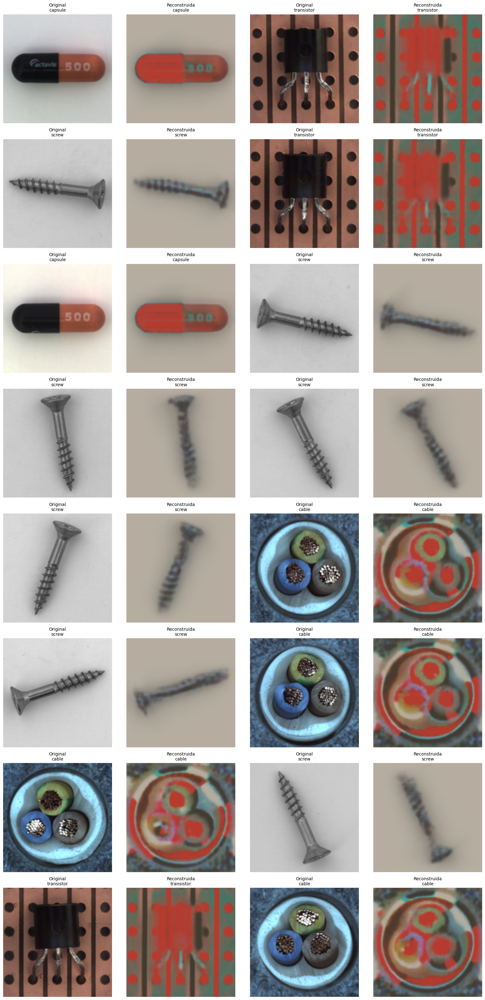

  - t-SNE del espacio latente
Ejecutando t-SNE (esto puede tomar un momento)...


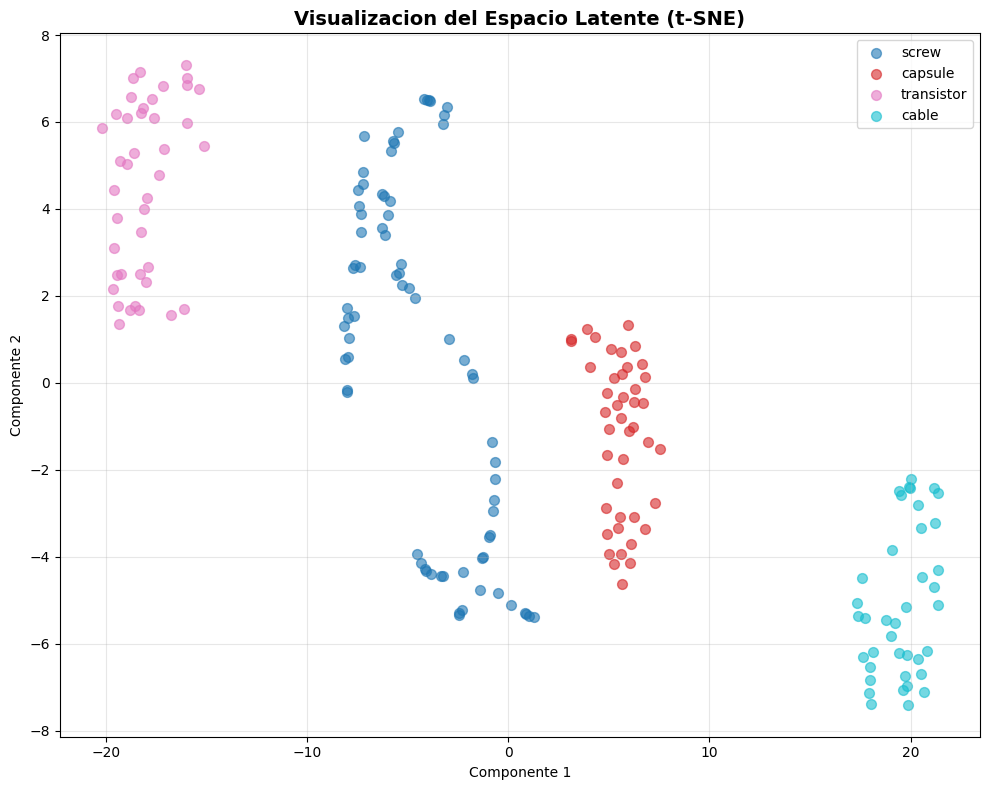

  - Histogramas de error por clase


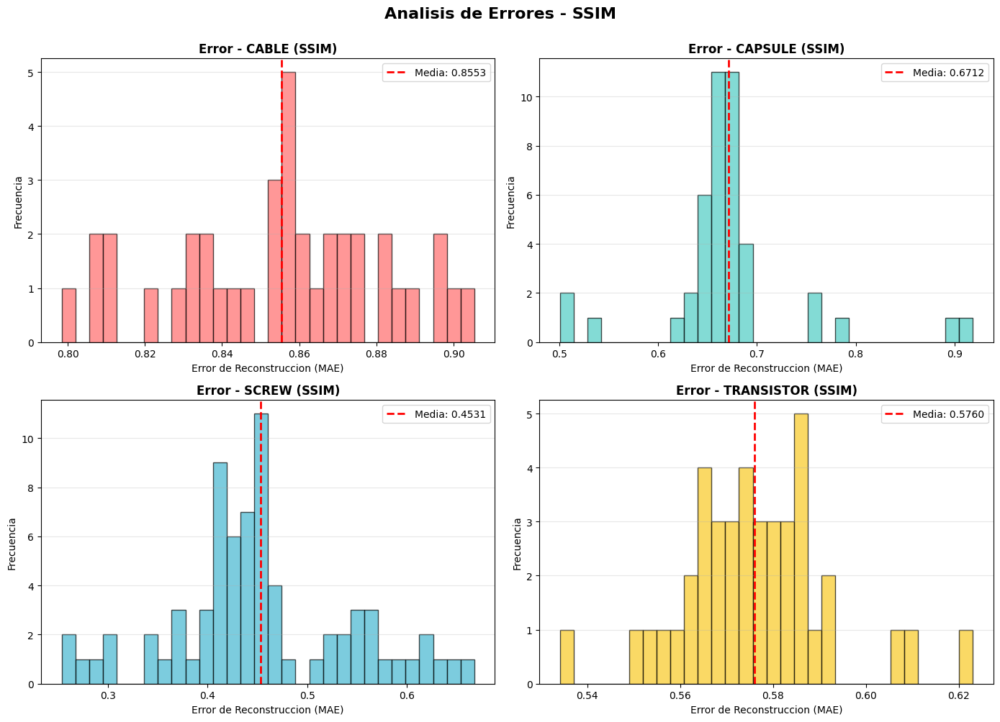


Experimento SSIM completado


In [ ]:
# Cargar mejor modelo SSIM
mejor_modelo_ssim = AutoencoderClasico.load_from_checkpoint(
    checkpoint_callback_ssim.best_model_path,
    config=cfg_ssim
)
mejor_modelo_ssim.eval()
mejor_modelo_ssim.to(device)

# Evaluacion cuantitativa
print("Evaluando modelo SSIM...")
metricas_ssim = evaluar_modelo(mejor_modelo_ssim, modulo_datos.val_dataloader(), dispositivo=device, num_batches=20)
print(f"  MAE: {metricas_ssim['mae']:.6f}")
print(f"  PSNR: {metricas_ssim['psnr']:.4f} dB")
print(f"  SSIM: {metricas_ssim['ssim']:.4f}")

# Guardar resultados
resultados_experimentos['ssim'] = {
    'metricas': metricas_ssim,
    'checkpoint': checkpoint_callback_ssim.best_model_path,
    'tiempo_entrenamiento': tiempo_ssim,
    'val_loss_final': checkpoint_callback_ssim.best_model_score.item() if checkpoint_callback_ssim.best_model_score else None
}

# Visualizaciones
print("\nGenerando visualizaciones SSIM...")
print("  - Reconstrucciones")
visualizar_reconstrucciones(mejor_modelo_ssim, modulo_datos.val_dataloader(), dispositivo=device, num_imagenes=16)

print("  - t-SNE del espacio latente")
visualizar_espacio_latente_tsne(mejor_modelo_ssim, modulo_datos.val_dataloader(), dispositivo=device, num_samples=500)

print("  - Histogramas de error por clase")
errores_por_clase_ssim = calcular_errores_por_clase(mejor_modelo_ssim, modulo_datos.val_dataloader(), dispositivo=device)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()
colores = ['#ff6b6b', '#4ecdc4', '#45b7d1', '#f9ca24']

for idx, (clase, errores) in enumerate(errores_por_clase_ssim.items()):
    ax = axes[idx]
    ax.hist(errores, bins=30, color=colores[idx], alpha=0.7, edgecolor='black')
    ax.set_title(f'Error - {clase.upper()} (SSIM)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Error de Reconstruccion (MAE)')
    ax.set_ylabel('Frecuencia')
    ax.grid(axis='y', alpha=0.3)
    media = np.mean(errores)
    ax.axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.4f}')
    ax.legend()

plt.suptitle('Analisis de Errores - SSIM', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

print("\nExperimento SSIM completado")

## 14. Entrenamiento con Funcion de Perdida SSIM+L1

Cuarta experimentacion: entrenamos el autoencoder con la funcion de perdida combinada SSIM+L1.

In [ ]:
# Configurar funcion de perdida SSIM+L1
cfg_ssim_l1 = copy.deepcopy(cfg)
cfg_ssim_l1.modelo.funcion_perdida = 'ssim_l1'

# Crear directorio para checkpoints SSIM+L1
checkpoint_dir_ssim_l1 = f"{cfg.entrenador.checkpoint.ruta_guardado}/ssim_l1"
os.makedirs(checkpoint_dir_ssim_l1, exist_ok=True)

# Callbacks
checkpoint_callback_ssim_l1 = ModelCheckpoint(
    dirpath=checkpoint_dir_ssim_l1,
    monitor=cfg.entrenador.checkpoint.monitor,
    mode=cfg.entrenador.checkpoint.modo,
    save_top_k=cfg.entrenador.checkpoint.guardar_top_k,
    filename='autoencoder-clasico-ssim_l1-{epoch:02d}-{val_loss:.4f}',
    verbose=True
)

early_stop_callback_ssim_l1 = EarlyStopping(
    monitor=cfg.entrenador.early_stopping.monitor,
    patience=cfg.entrenador.early_stopping.paciencia,
    mode=cfg.entrenador.early_stopping.modo,
    verbose=True
)

# Logger de W&B
if USAR_WANDB:
    timestamp = int(time.time())
    wandb_logger_ssim_l1 = WandbLogger(
        project=cfg.logger.proyecto,
        name=f"{cfg.logger.nombre}-ssim_l1-{timestamp}",
        save_dir=cfg.logger.ruta_guardado,
        offline=MODO_OFFLINE,
        log_model=cfg.logger.log_modelo,
        tags=['ssim_l1', 'autoencoder-clasico'],
        reinit=True
    )
    logger_ssim_l1 = wandb_logger_ssim_l1
    print(f"WandbLogger creado: {cfg.logger.nombre}-ssim_l1-{timestamp}")
else:
    logger_ssim_l1 = True

# Trainer
entrenador_ssim_l1 = pl.Trainer(
    max_epochs=cfg_ssim_l1.entrenador.max_epocas,
    accelerator=cfg_ssim_l1.entrenador.acelerador,
    devices=cfg_ssim_l1.entrenador.dispositivos,
    precision=cfg_ssim_l1.entrenador.precision,
    callbacks=[checkpoint_callback_ssim_l1, early_stop_callback_ssim_l1],
    logger=logger_ssim_l1,
    log_every_n_steps=cfg_ssim_l1.entrenador.log_cada_n_pasos,
    gradient_clip_val=cfg_ssim_l1.entrenador.gradient_clip_val,
    enable_progress_bar=True,
    enable_model_summary=True
)

# Crear y entrenar modelo
modelo_ssim_l1 = AutoencoderClasico(cfg_ssim_l1)
print(f"\nINICIANDO ENTRENAMIENTO - SSIM+L1")
print(f"Parametros: {sum(p.numel() for p in modelo_ssim_l1.parameters()):,}")
print(f"Epocas: {cfg_ssim_l1.entrenador.max_epocas}")

tiempo_inicio_ssim_l1 = time.time()
entrenador_ssim_l1.fit(modelo_ssim_l1, modulo_datos)
tiempo_ssim_l1 = time.time() - tiempo_inicio_ssim_l1

print(f"\nEntrenamiento SSIM+L1 completado en {tiempo_ssim_l1/60:.1f} minutos")
print(f"Mejor checkpoint: {checkpoint_callback_ssim_l1.best_model_path}")

# Cerrar W&B
if USAR_WANDB:
    wandb.finish()
    print("Run de W&B cerrado")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


WandbLogger creado: autoencoder-clasico-colab-ssim_l1-1763957705

INICIANDO ENTRENAMIENTO - SSIM+L1
Parametros: 12,971,971
Epocas: 50


### Evaluacion y Visualizacion - SSIM+L1

Evaluando modelo SSIM+L1...
  MAE: 0.405781
  PSNR: 18.1189 dB
  SSIM: 0.6923

Generando visualizaciones SSIM+L1...
  - Reconstrucciones


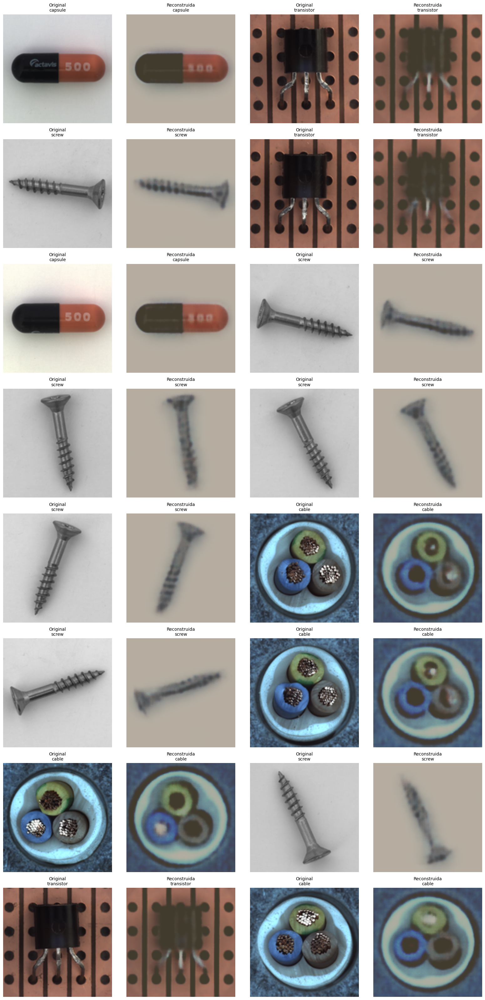

  - t-SNE del espacio latente
Ejecutando t-SNE (esto puede tomar un momento)...


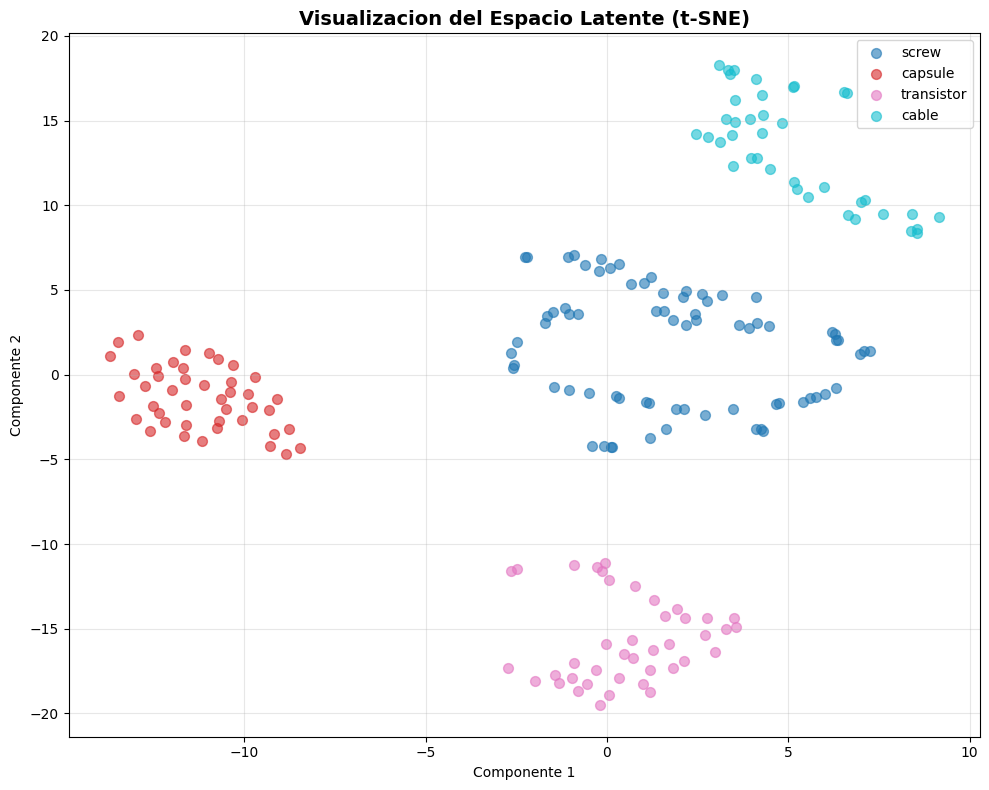

  - Histogramas de error por clase


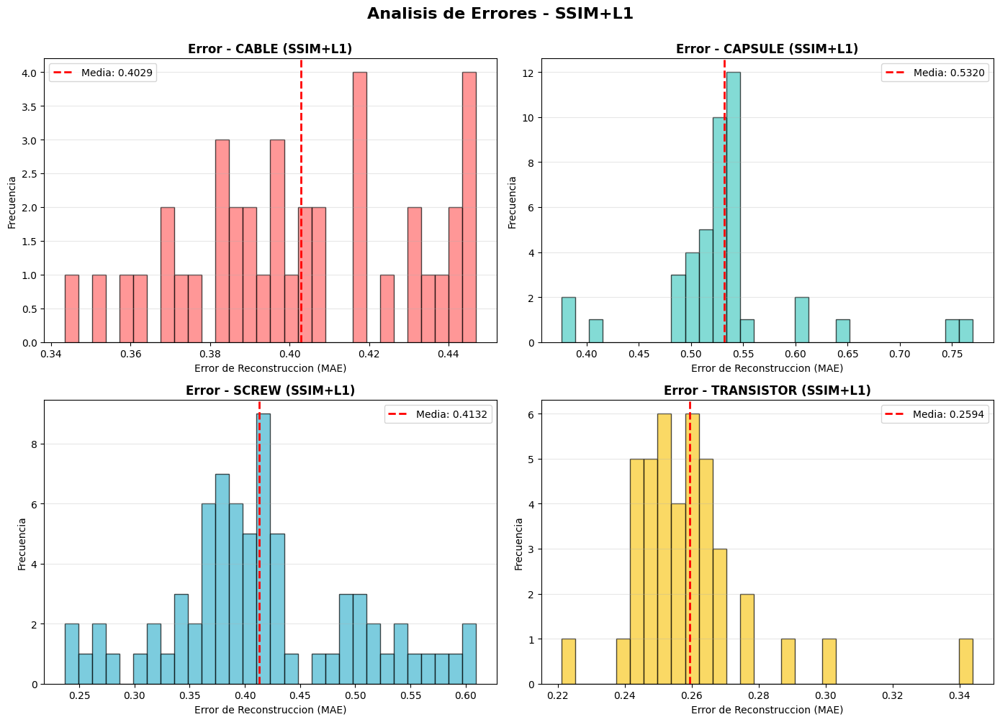


Experimento SSIM+L1 completado


In [21]:
# Cargar mejor modelo SSIM+L1
mejor_modelo_ssim_l1 = AutoencoderClasico.load_from_checkpoint(
    checkpoint_callback_ssim_l1.best_model_path,
    config=cfg_ssim_l1
)
mejor_modelo_ssim_l1.eval()
mejor_modelo_ssim_l1.to(device)

# Evaluacion cuantitativa
print("Evaluando modelo SSIM+L1...")
metricas_ssim_l1 = evaluar_modelo(mejor_modelo_ssim_l1, modulo_datos.val_dataloader(), dispositivo=device, num_batches=20)
print(f"  MAE: {metricas_ssim_l1['mae']:.6f}")
print(f"  PSNR: {metricas_ssim_l1['psnr']:.4f} dB")
print(f"  SSIM: {metricas_ssim_l1['ssim']:.4f}")

# Guardar resultados
resultados_experimentos['ssim_l1'] = {
    'metricas': metricas_ssim_l1,
    'checkpoint': checkpoint_callback_ssim_l1.best_model_path,
    'tiempo_entrenamiento': tiempo_ssim_l1,
    'val_loss_final': checkpoint_callback_ssim_l1.best_model_score.item() if checkpoint_callback_ssim_l1.best_model_score else None
}

# Visualizaciones
print("\nGenerando visualizaciones SSIM+L1...")
print("  - Reconstrucciones")
visualizar_reconstrucciones(mejor_modelo_ssim_l1, modulo_datos.val_dataloader(), dispositivo=device, num_imagenes=16)

print("  - t-SNE del espacio latente")
visualizar_espacio_latente_tsne(mejor_modelo_ssim_l1, modulo_datos.val_dataloader(), dispositivo=device, num_samples=500)

print("  - Histogramas de error por clase")
errores_por_clase_ssim_l1 = calcular_errores_por_clase(mejor_modelo_ssim_l1, modulo_datos.val_dataloader(), dispositivo=device)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()
colores = ['#ff6b6b', '#4ecdc4', '#45b7d1', '#f9ca24']

for idx, (clase, errores) in enumerate(errores_por_clase_ssim_l1.items()):
    ax = axes[idx]
    ax.hist(errores, bins=30, color=colores[idx], alpha=0.7, edgecolor='black')
    ax.set_title(f'Error - {clase.upper()} (SSIM+L1)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Error de Reconstruccion (MAE)')
    ax.set_ylabel('Frecuencia')
    ax.grid(axis='y', alpha=0.3)
    media = np.mean(errores)
    ax.axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.4f}')
    ax.legend()

plt.suptitle('Analisis de Errores - SSIM+L1', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

print("\nExperimento SSIM+L1 completado")

## 15. Comparacion Final de las 4 Funciones de Perdida

Ahora que ya se hicieron  los 4 entrenamientos (L1, L2, SSIM, SSIM+L1), esta seccion compara los resultados y presenta tablas y graficos comparativos.

TABLA COMPARATIVA - RESULTADOS DE LAS 4 FUNCIONES DE PERDIDA

Funcion de Perdida  Val Loss      MAE  PSNR (dB)     SSIM  Tiempo (min)                                                Checkpoint
                L1  0.423256 0.424291  17.695988 0.614489      7.166933      autoencoder-clasico-l1-epoch=30-val_loss=0.4233.ckpt
                L2  0.264931 0.408283  18.107257 0.649509      4.399926      autoencoder-clasico-l2-epoch=49-val_loss=0.2649.ckpt
              SSIM  0.238845 0.603828  14.557500 0.614800      6.379050    autoencoder-clasico-ssim-epoch=49-val_loss=0.2388.ckpt
           SSIM_L1  0.642267 0.405781  18.118896 0.692344      8.190290 autoencoder-clasico-ssim_l1-epoch=49-val_loss=0.6423.ckpt

MEJORES MODELOS POR METRICA
Menor Val Loss:    SSIM (0.2388)
Menor MAE:         SSIM_L1 (0.405781)
Mayor PSNR:        SSIM_L1 (18.1189 dB)
Mayor SSIM:        SSIM_L1 (0.6923)



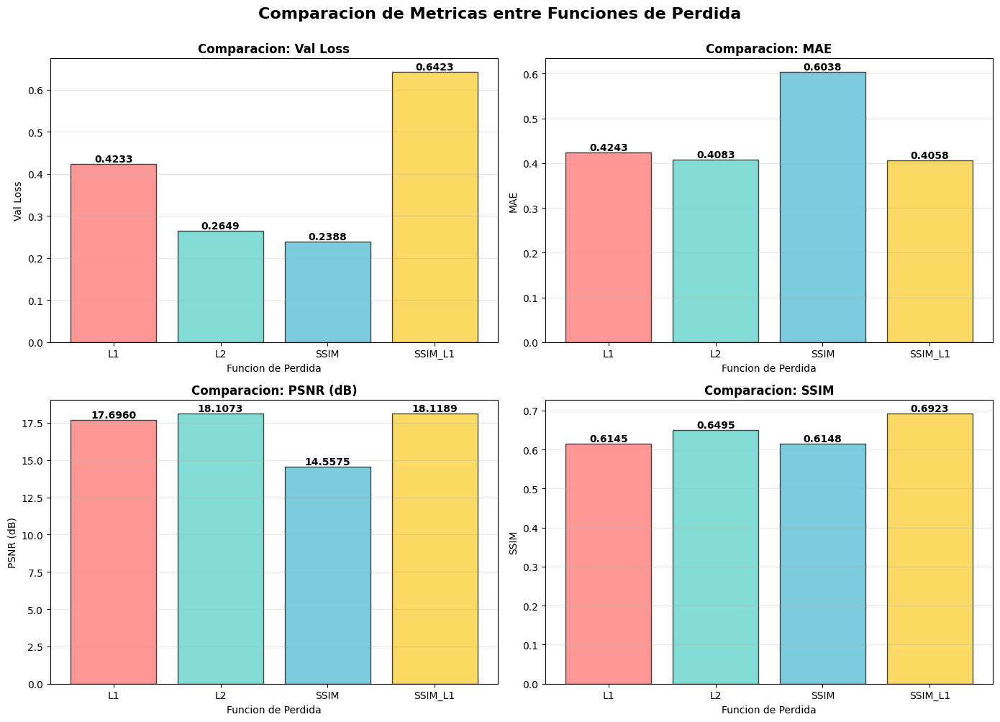


Tabla guardada en: /content/checkpoints/comparacion_resultados.csv
RESUMEN
Checkpoints guardados en: /content/checkpoints/
  - L1: /content/checkpoints/l1/
  - L2: /content/checkpoints/l2/
  - SSIM: /content/checkpoints/ssim/
  - SSIM+L1: /content/checkpoints/ssim_l1/

Weights & Biases: https://wandb.ai → proyecto 'autoencoder-clasico-mvtec'
  - Cada funcion de perdida tiene su propio run
  - Las imagenes estan separadas por funcion dentro de cada run


In [22]:
import pandas as pd

# Verificar que existan resultados
if 'resultados_experimentos' not in globals() or len(resultados_experimentos) == 0:
    print("No se encontraron resultados de experimentos.")
    print("Ejecuta primero las celdas de entrenamiento (L1, L2, SSIM, SSIM+L1) para generar los resultados.")
else:
    print("TABLA COMPARATIVA - RESULTADOS DE LAS 4 FUNCIONES DE PERDIDA")

    # aqui voy a crear el DataFrame con los resultados
    datos_comparacion = []

    for nombre_perdida, resultado in resultados_experimentos.items():
        if 'error' not in resultado:
            fila = {
                'Funcion de Perdida': nombre_perdida.upper(),
                'Val Loss': resultado['val_loss_final'],
                'MAE': resultado['metricas']['mae'],
                'PSNR (dB)': resultado['metricas']['psnr'],
                'SSIM': resultado['metricas']['ssim'],
                'Tiempo (min)': resultado['tiempo_entrenamiento'] / 60,
                'Checkpoint': os.path.basename(resultado['checkpoint'])
            }
            datos_comparacion.append(fila)

    df_comparacion = pd.DataFrame(datos_comparacion)

    # Mostrar tabla
    print("\n" + df_comparacion.to_string(index=False))
    print()

    # Identificar mejor modelo por metrica
    print("MEJORES MODELOS POR METRICA")

    idx_mejor_val_loss = df_comparacion['Val Loss'].idxmin()
    idx_mejor_mae = df_comparacion['MAE'].idxmin()
    idx_mejor_psnr = df_comparacion['PSNR (dB)'].idxmax()
    idx_mejor_ssim = df_comparacion['SSIM'].idxmax()

    print(f"Menor Val Loss:    {df_comparacion.iloc[idx_mejor_val_loss]['Funcion de Perdida']} ({df_comparacion.iloc[idx_mejor_val_loss]['Val Loss']:.4f})")
    print(f"Menor MAE:         {df_comparacion.iloc[idx_mejor_mae]['Funcion de Perdida']} ({df_comparacion.iloc[idx_mejor_mae]['MAE']:.6f})")
    print(f"Mayor PSNR:        {df_comparacion.iloc[idx_mejor_psnr]['Funcion de Perdida']} ({df_comparacion.iloc[idx_mejor_psnr]['PSNR (dB)']:.4f} dB)")
    print(f"Mayor SSIM:        {df_comparacion.iloc[idx_mejor_ssim]['Funcion de Perdida']} ({df_comparacion.iloc[idx_mejor_ssim]['SSIM']:.4f})")
    print()

    # Visualizacion comparativa de metricas
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    metricas_plot = ['Val Loss', 'MAE', 'PSNR (dB)', 'SSIM']
    colores = ['#ff6b6b', '#4ecdc4', '#45b7d1', '#f9ca24']

    for idx, metrica in enumerate(metricas_plot):
        ax = axes[idx // 2, idx % 2]
        bars = ax.bar(df_comparacion['Funcion de Perdida'], df_comparacion[metrica],
                      color=colores, alpha=0.7, edgecolor='black')

        ax.set_title(f'Comparacion: {metrica}', fontsize=12, fontweight='bold')
        ax.set_ylabel(metrica)
        ax.set_xlabel('Funcion de Perdida')
        ax.grid(axis='y', alpha=0.3)

        # Anadir valores sobre las barras
        for bar, valor in zip(bars, df_comparacion[metrica]):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                    f'{valor:.4f}',
                    ha='center', va='bottom', fontsize=10, fontweight='bold')

    plt.suptitle('Comparacion de Metricas entre Funciones de Perdida',
                 fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()

    # Guardar tabla en CSV
    csv_path = f"{cfg.entrenador.checkpoint.ruta_guardado}/comparacion_resultados.csv"
    df_comparacion.to_csv(csv_path, index=False)
    print(f"\nTabla guardada en: {csv_path}")

    # Resumen para el informe
    print("RESUMEN")
    print(f"Checkpoints guardados en: {cfg.entrenador.checkpoint.ruta_guardado}/")
    print(f"  - L1: {cfg.entrenador.checkpoint.ruta_guardado}/l1/")
    print(f"  - L2: {cfg.entrenador.checkpoint.ruta_guardado}/l2/")
    print(f"  - SSIM: {cfg.entrenador.checkpoint.ruta_guardado}/ssim/")
    print(f"  - SSIM+L1: {cfg.entrenador.checkpoint.ruta_guardado}/ssim_l1/")
    print(f"\nWeights & Biases: https://wandb.ai → proyecto '{cfg.logger.proyecto}'")
    print("  - Cada funcion de perdida tiene su propio run")
    print("  - Las imagenes estan separadas por funcion dentro de cada run")


## 17. Finalizar Experimento

Cerramos la sesión de WandB y guardamos los resultados finales.

In [27]:
# Cerrar sesión de WandB
if USAR_WANDB:
    wandb.finish()
    print("Sesión de WandB cerrada")

print("EXPERIMENTO COMPLETADO")


Sesión de WandB cerrada
EXPERIMENTO COMPLETADO




###  **Cómo Cambiar la Función de Pérdida**

Para experimentar con diferentes funciones de pérdida, modifica la **Sección 5** (Configuración):

```yaml
modelo:
  # CAMBIAR AQUÍ LA FUNCIÓN DE PÉRDIDA
  # Opciones: 'l1', 'l2', 'ssim', 'ssim_l1'
  funcion_perdida: 'l1'  # ← Cambiar este valor
```

Opciones disponibles:
- `'l1'`: MAE (robusto, suave)
- `'l2'`: MSE (penaliza errores grandes)
- `'ssim'`: Preserva estructura
- `'ssim_l1'`: Mejor de ambos mundos

**Luego**: Ejecute todas las celdas desde la Sección 5 en adelante para entrenar con la nueva función.



### **Para para Colab**

1. **Verificar GPU**: Fíjese de tener GPU activada (Runtime → Change runtime type → GPU)
2. **Sesiones largas**: El entrenamiento puede durar un rato dependiendo de la GPU
3. **Guardar checkpoints**: Los checkpoints se guardan automáticamente en `/content/checkpoints`
4. **WandB offline**: Si tiene problemas de conexión, activa `MODO_OFFLINE = True`
5. **RAM insuficiente**: Reduce `batch_size` o `num_workers` si hay problemas de memoria

